In [217]:
import numpy as np
import pandas as pd
%matplotlib inline 
import seaborn as sns
import matplotlib.pyplot as plt
housing = pd.read_csv('./data/Ames_Housing_Price_Data.csv', index_col=0)
housing.shape

(2580, 81)

In [125]:
#Created missing_value_columns to see all the columns that are missing values
missing_value_columns=housing.isnull().sum(axis=0).sort_values(ascending=False)
missing_value_columns=missing_value_columns.rename_axis('Attributes').to_frame('Counts')
missing_value_columns = missing_value_columns.loc[missing_value_columns.Counts!=0]

In [73]:
housing['PoolQC'].value_counts()

TA    3
Fa    2
Gd    2
Ex    2
Name: PoolQC, dtype: int64

In [91]:
housing['MiscFeature'].value_counts()

Shed    88
Gar2     5
Othr     3
TenC     1
Name: MiscFeature, dtype: int64

In [128]:
housing['Fence'].value_counts()

MnPrv    301
GdPrv    111
GdWo     103
MnWw      10
Name: Fence, dtype: int64

In [136]:
housing['Alley'].value_counts()

Grvl    105
Pave     63
Name: Alley, dtype: int64

In [180]:
# Created a copy of the dataframe
housing_fill = housing.copy()

In [166]:
housing.head()

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1,909176150,856,126000,30,RL,NaN,7890,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,SWISU,Norm,Norm,1Fam,1Story,6,6,1939,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,238.0,Unf,0.0,618.0,856.0,GasA,TA,Y,SBrkr,856,0,0,1.0,0.0,1,0,2,1,TA,4,Typ,1,Gd,Detchd,1939.0,Unf,2.0,399.0,TA,TA,Y,0,0,0,0,166,0,NaN,NaN,NaN,0,3,2010,WD,Normal
2,905476230,1049,139500,120,RL,42.0,4235,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,1Story,5,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,BrkFace,149.0,Gd,TA,CBlock,Gd,TA,Mn,GLQ,552.0,ALQ,393.0,104.0,1049.0,GasA,TA,Y,SBrkr,1049,0,0,1.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1984.0,Fin,1.0,266.0,TA,TA,Y,0,105,0,0,0,0,NaN,NaN,NaN,0,2,2009,WD,Normal
3,911128020,1001,124900,30,C (all),60.0,6060,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,5,9,1930,2007,Hip,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,BrkTil,TA,TA,No,ALQ,737.0,Unf,0.0,100.0,837.0,GasA,Ex,Y,SBrkr,1001,0,0,0.0,0.0,1,0,2,1,Gd,5,Typ,0,NaN,Detchd,1930.0,Unf,1.0,216.0,TA,Po,N,154,0,42,86,0,0,NaN,NaN,NaN,0,11,2007,WD,Normal
4,535377150,1039,114000,70,RL,80.0,8146,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Norm,Norm,1Fam,2Story,4,8,1900,2003,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,Gd,BrkTil,Fa,TA,No,Unf,0.0,Unf,0.0,405.0,405.0,GasA,Gd,Y,SBrkr,717,322,0,0.0,0.0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1940.0,Unf,1.0,281.0,TA,TA,N,0,0,168,0,111,0,NaN,NaN,NaN,0,5,2009,WD,Normal
5,534177230,1665,227000,60,RL,70.0,8400,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,2Story,8,6,2001,2001,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,643.0,Unf,0.0,167.0,810.0,GasA,Ex,Y,SBrkr,810,855,0,1.0,0.0,2,1,3,1,Gd,6,Typ,0,NaN,Attchd,2001.0,Fin,2.0,528.0,TA,TA,Y,0,45,0,0,0,0,NaN,NaN,NaN,0,11,2009,WD,Normal


In [181]:
# Filled 'Naa' meaning 'no alley access' in rows that had null values based on data_description
housing_fill.loc[housing_fill.Alley.isnull(),'Alley'] = 'Naa'

In [182]:
housing_fill['Alley'].value_counts()

Naa     2412
Grvl     105
Pave      63
Name: Alley, dtype: int64

In [183]:
# Filled 'Nf' meaning 'no fence' in rows that had null values based on data_description
housing_fill.loc[housing_fill.Fence.isnull(),'Fence'] = 'Nf'

In [156]:
housing_fill.head()

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1,909176150,856,126000,30,RL,NaN,7890,Pave,Naa,Reg,Lvl,AllPub,Corner,Gtl,SWISU,Norm,Norm,1Fam,1Story,6,6,1939,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,238.0,Unf,0.0,618.0,856.0,GasA,TA,Y,SBrkr,856,0,0,1.0,0.0,1,0,2,1,TA,4,Typ,1,Gd,Detchd,1939.0,Unf,2.0,399.0,TA,TA,Y,0,0,0,0,166,0,NaN,Nf,NaN,0,3,2010,WD,Normal
2,905476230,1049,139500,120,RL,42.0,4235,Pave,Naa,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,1Story,5,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,BrkFace,149.0,Gd,TA,CBlock,Gd,TA,Mn,GLQ,552.0,ALQ,393.0,104.0,1049.0,GasA,TA,Y,SBrkr,1049,0,0,1.0,0.0,2,0,2,1,Gd,5,Typ,0,Nfp,Attchd,1984.0,Fin,1.0,266.0,TA,TA,Y,0,105,0,0,0,0,NaN,Nf,NaN,0,2,2009,WD,Normal
3,911128020,1001,124900,30,C (all),60.0,6060,Pave,Naa,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,5,9,1930,2007,Hip,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,BrkTil,TA,TA,No,ALQ,737.0,Unf,0.0,100.0,837.0,GasA,Ex,Y,SBrkr,1001,0,0,0.0,0.0,1,0,2,1,Gd,5,Typ,0,Nfp,Detchd,1930.0,Unf,1.0,216.0,TA,Po,N,154,0,42,86,0,0,NaN,Nf,NaN,0,11,2007,WD,Normal
4,535377150,1039,114000,70,RL,80.0,8146,Pave,Naa,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Norm,Norm,1Fam,2Story,4,8,1900,2003,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,Gd,BrkTil,Fa,TA,No,Unf,0.0,Unf,0.0,405.0,405.0,GasA,Gd,Y,SBrkr,717,322,0,0.0,0.0,1,0,2,1,TA,6,Typ,0,Nfp,Detchd,1940.0,Unf,1.0,281.0,TA,TA,N,0,0,168,0,111,0,NaN,Nf,NaN,0,5,2009,WD,Normal
5,534177230,1665,227000,60,RL,70.0,8400,Pave,Naa,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,2Story,8,6,2001,2001,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,643.0,Unf,0.0,167.0,810.0,GasA,Ex,Y,SBrkr,810,855,0,1.0,0.0,2,1,3,1,Gd,6,Typ,0,Nfp,Attchd,2001.0,Fin,2.0,528.0,TA,TA,Y,0,45,0,0,0,0,NaN,Nf,NaN,0,11,2009,WD,Normal


In [184]:
# Filled 'Nfp' meaning 'no fireplace' in FireplaceQu rows that had null values based on data_description
housing_fill.loc[housing_fill.FireplaceQu.isnull(),'FireplaceQu'] = 'Nfp'

In [185]:
#Filled 'Ng' meaning 'no garage' in rows that had null values based on data_description
housing_fill.loc[housing_fill.GarageQual.isnull(),'GarageQual'] = 'Ng'
housing_fill.loc[housing_fill.GarageFinish.isnull(),'GarageFinish'] = 'Ng'
housing_fill.loc[housing_fill.GarageCond.isnull(),'GarageCond'] = 'Ng'
housing_fill.loc[housing_fill.GarageType.isnull(),'GarageType'] = 'Ng'
housing_fill.loc[housing_fill.GarageType.isnull(),'GarageType'] = 'Ng'

In [186]:
#Filled 'Nb' meaning 'no basement' in rows that had null values based on data_description
housing_fill.loc[housing_fill.BsmtExposure.isnull(),'BsmtExposure'] = 'Nb'
housing_fill.loc[housing_fill.BsmtFinType2.isnull(),'BsmtFinType2'] = 'Nb'
housing_fill.loc[housing_fill.BsmtQual.isnull(),'BsmtQual'] = 'Nb'
housing_fill.loc[housing_fill.BsmtCond.isnull(),'BsmtCond'] = 'Nb'
housing_fill.loc[housing_fill.BsmtFinType1.isnull(),'BsmtFinType1'] = 'Nb'

In [177]:
# Majority rows i.e. 1554 have 0 in MasVnrArea so can't impute the area
housing_fill['MasVnrArea'].value_counts()

1554

In [187]:
#Filled 'NA' meaning 'not available' in rows that had null values. This is only 14 rows for both columns
housing_fill.loc[housing_fill.MasVnrType.isnull(),'MasVnrType'] = 'NA'
housing_fill.loc[housing_fill.MasVnrArea.isnull(),'MasVnrArea'] = -1

In [197]:
#Filled -1 in rows that had null values. This is only 2 rows for BsmtFullBath and BsmtHalfBath each and 1 esch for the remaining Bsmt columns
housing_fill.loc[housing_fill.BsmtFullBath.isnull(),'BsmtFullBath'] = -1
housing_fill.loc[housing_fill.BsmtHalfBath.isnull(),'BsmtHalfBath'] = -1
housing_fill.loc[housing_fill.BsmtUnfSF.isnull(),'BsmtUnfSF'] = -1
housing_fill.loc[housing_fill.BsmtFinSF2.isnull(),'BsmtFinSF2'] = -1
housing_fill.loc[housing_fill.BsmtFinSF1.isnull(),'BsmtFinSF1'] = -1
housing_fill.loc[housing_fill.TotalBsmtSF.isnull(),'TotalBsmtSF'] = -1

In [202]:
housing_fill.loc[housing_fill.GarageCars.isnull(),'GarageCars'] = -1
housing_fill.loc[housing_fill.GarageArea.isnull(),'GarageArea'] = -1

In [450]:
# 129 missing (Nan) values in GarageYrBlt substituted with 1600
housing_fill.loc[housing_fill['GarageYrBlt']==1600,'GarageYrBlt'] = 1900

In [456]:
housing_fill.GarageYrBlt.unique()

array([1939., 1984., 1930., 1940., 2001., 2003., 1974., 2007., 2005.,
       1993., 1920., 1963., 2002., 1900., 1977., 2006., 1948., 1950.,
       1997., 2000., 1973., 1938., 1922., 1964., 2008., 1999., 1921.,
       1976., 1983., 1958., 1990., 2004., 1949., 1966., 1972., 1960.,
       1991., 1954., 1978., 1969., 1916., 1971., 1975., 1959., 1970.,
       1956., 1979., 1965., 1961., 1962., 1981., 1992., 1998., 1917.,
       1980., 1955., 1996., 1910., 1957., 1994., 1943., 1968., 1951.,
       2009., 1995., 1925., 1988., 1952., 1953., 1987., 1926., 1989.,
       1945., 1941., 1937., 1982., 1927., 1986., 1915., 1967., 1985.,
       1908., 1947., 1936., 1924., 1928., 1934., 2010., 1946., 1929.,
       1935., 1932., 1942., 1931., 1914., 1933., 1923., 1918., 1906.,
       1895.])

In [211]:
housing['LotFrontage'].value_counts()

60.0     246
80.0     128
70.0     124
50.0     111
75.0      92
65.0      79
85.0      64
24.0      49
21.0      46
78.0      42
63.0      42
90.0      41
74.0      38
68.0      36
72.0      31
64.0      30
73.0      28
79.0      27
52.0      26
62.0      26
100.0     24
57.0      23
51.0      23
76.0      22
55.0      22
59.0      22
66.0      22
88.0      21
53.0      20
82.0      20
43.0      19
67.0      19
40.0      17
56.0      17
61.0      17
69.0      16
35.0      16
71.0      16
81.0      15
44.0      15
110.0     14
84.0      14
34.0      13
77.0      13
41.0      13
58.0      13
48.0      13
95.0      13
120.0     12
96.0      12
86.0      11
42.0      11
98.0      11
105.0     10
83.0      10
87.0      10
45.0       9
92.0       9
36.0       9
54.0       9
94.0       9
30.0       8
32.0       8
102.0      8
93.0       8
91.0       7
47.0       7
37.0       7
89.0       6
99.0       6
39.0       5
49.0       5
108.0      5
130.0      5
114.0      4
107.0      4
38.0       4

In [457]:
housing_fill.to_csv('./housing_fill.csv')

(0.0, 20000.0)

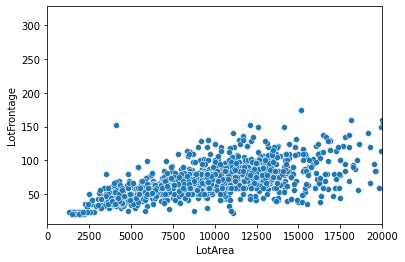

In [219]:
sns.scatterplot(x='LotArea', y='LotFrontage', data = housing_fill)
plt.xlim(0, 20000)

In [234]:
housing_fill.head()

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1,909176150,856,126000,30,RL,NaN,7890,Pave,Naa,Reg,Lvl,AllPub,Corner,Gtl,SWISU,Norm,Norm,1Fam,1Story,6,6,1939,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,238.0,Unf,0.0,618.0,856.0,GasA,TA,Y,SBrkr,856,0,0,1.0,0.0,1,0,2,1,TA,4,Typ,1,Gd,Detchd,1939.0,Unf,2.0,399.0,TA,TA,Y,0,0,0,0,166,0,NaN,Nf,NaN,0,3,2010,WD,Normal
2,905476230,1049,139500,120,RL,42.0,4235,Pave,Naa,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,1Story,5,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,BrkFace,149.0,Gd,TA,CBlock,Gd,TA,Mn,GLQ,552.0,ALQ,393.0,104.0,1049.0,GasA,TA,Y,SBrkr,1049,0,0,1.0,0.0,2,0,2,1,Gd,5,Typ,0,Nfp,Attchd,1984.0,Fin,1.0,266.0,TA,TA,Y,0,105,0,0,0,0,NaN,Nf,NaN,0,2,2009,WD,Normal
3,911128020,1001,124900,30,C (all),60.0,6060,Pave,Naa,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,5,9,1930,2007,Hip,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,BrkTil,TA,TA,No,ALQ,737.0,Unf,0.0,100.0,837.0,GasA,Ex,Y,SBrkr,1001,0,0,0.0,0.0,1,0,2,1,Gd,5,Typ,0,Nfp,Detchd,1930.0,Unf,1.0,216.0,TA,Po,N,154,0,42,86,0,0,NaN,Nf,NaN,0,11,2007,WD,Normal
4,535377150,1039,114000,70,RL,80.0,8146,Pave,Naa,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Norm,Norm,1Fam,2Story,4,8,1900,2003,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,Gd,BrkTil,Fa,TA,No,Unf,0.0,Unf,0.0,405.0,405.0,GasA,Gd,Y,SBrkr,717,322,0,0.0,0.0,1,0,2,1,TA,6,Typ,0,Nfp,Detchd,1940.0,Unf,1.0,281.0,TA,TA,N,0,0,168,0,111,0,NaN,Nf,NaN,0,5,2009,WD,Normal
5,534177230,1665,227000,60,RL,70.0,8400,Pave,Naa,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,2Story,8,6,2001,2001,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,643.0,Unf,0.0,167.0,810.0,GasA,Ex,Y,SBrkr,810,855,0,1.0,0.0,2,1,3,1,Gd,6,Typ,0,Nfp,Attchd,2001.0,Fin,2.0,528.0,TA,TA,Y,0,45,0,0,0,0,NaN,Nf,NaN,0,11,2009,WD,Normal


In [458]:
housing_fill_drop = housing_fill.drop(['PoolQC', 'MiscFeature'], axis =1)

In [243]:
housing_fill_drop.sort_index(axis=1).head()

,1stFlrSF,2ndFlrSF,3SsnPorch,Alley,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,BsmtFinType1,BsmtFinType2,BsmtFullBath,BsmtHalfBath,BsmtQual,BsmtUnfSF,CentralAir,Condition1,Condition2,Electrical,EnclosedPorch,ExterCond,ExterQual,Exterior1st,Exterior2nd,Fence,FireplaceQu,Fireplaces,Foundation,FullBath,Functional,GarageArea,GarageCars,GarageCond,GarageFinish,GarageQual,GarageType,GarageYrBlt,GrLivArea,HalfBath,Heating,HeatingQC,HouseStyle,KitchenAbvGr,KitchenQual,LandContour,LandSlope,LotArea,LotConfig,LotFrontage,LotShape,LowQualFinSF,MSSubClass,MSZoning,MasVnrArea,MasVnrType,MiscVal,MoSold,Neighborhood,OpenPorchSF,OverallCond,OverallQual,PID,PavedDrive,PoolArea,RoofMatl,RoofStyle,SaleCondition,SalePrice,SaleType,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,Utilities,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
1,856,0,0,Naa,2,1Fam,TA,No,238.0,0.0,Rec,Unf,1.0,0.0,TA,618.0,Y,Norm,Norm,SBrkr,0,TA,TA,Wd Sdng,Wd Sdng,Nf,Gd,1,CBlock,1,Typ,399.0,2.0,TA,Unf,TA,Detchd,1939.0,856,0,GasA,TA,1Story,1,TA,Lvl,Gtl,7890,Corner,NaN,Reg,0,30,RL,0.0,None,0,3,SWISU,0,6,6,909176150,Y,0,CompShg,Gable,Normal,126000,WD,166,Pave,4,856.0,AllPub,0,1939,1950,2010
2,1049,0,0,Naa,2,TwnhsE,TA,Mn,552.0,393.0,GLQ,ALQ,1.0,0.0,Gd,104.0,Y,Norm,Norm,SBrkr,0,TA,Gd,HdBoard,HdBoard,Nf,Nfp,0,CBlock,2,Typ,266.0,1.0,TA,Fin,TA,Attchd,1984.0,1049,0,GasA,TA,1Story,1,Gd,Lvl,Gtl,4235,Inside,42.0,Reg,0,120,RL,149.0,BrkFace,0,2,Edwards,105,5,5,905476230,Y,0,CompShg,Gable,Normal,139500,WD,0,Pave,5,1049.0,AllPub,0,1984,1984,2009
3,1001,0,86,Naa,2,1Fam,TA,No,737.0,0.0,ALQ,Unf,0.0,0.0,TA,100.0,Y,Norm,Norm,SBrkr,42,TA,Gd,MetalSd,MetalSd,Nf,Nfp,0,BrkTil,1,Typ,216.0,1.0,Po,Unf,TA,Detchd,1930.0,1001,0,GasA,Ex,1Story,1,Gd,Lvl,Gtl,6060,Inside,60.0,Reg,0,30,C (all),0.0,None,0,11,IDOTRR,0,9,5,911128020,N,0,CompShg,Hip,Normal,124900,WD,0,Pave,5,837.0,AllPub,154,1930,2007,2007
4,717,322,0,Naa,2,1Fam,TA,No,0.0,0.0,Unf,Unf,0.0,0.0,Fa,405.0,Y,Norm,Norm,SBrkr,168,Gd,Gd,MetalSd,MetalSd,Nf,Nfp,0,BrkTil,1,Typ,281.0,1.0,TA,Unf,TA,Detchd,1940.0,1039,0,GasA,Gd,2Story,1,TA,Lvl,Gtl,8146,Corner,80.0,Reg,0,70,RL,0.0,None,0,5,OldTown,0,8,4,535377150,N,0,CompShg,Gable,Normal,114000,WD,111,Pave,6,405.0,AllPub,0,1900,2003,2009
5,810,855,0,Naa,3,1Fam,TA,No,643.0,0.0,GLQ,Unf,1.0,0.0,Gd,167.0,Y,Norm,Norm,SBrkr,0,TA,Gd,VinylSd,VinylSd,Nf,Nfp,0,PConc,2,Typ,528.0,2.0,TA,Fin,TA,Attchd,2001.0,1665,1,GasA,Ex,2Story,1,Gd,Lvl,Gtl,8400,Inside,70.0,Reg,0,60,RL,0.0,None,0,11,NWAmes,45,6,8,534177230,Y,0,CompShg,Gable,Normal,227000,WD,0,Pave,6,810.0,AllPub,0,2001,2001,2009


In [321]:
housing_fill_drop.sort_index(axis=1).columns

Index(['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'Alley', 'BedroomAbvGr',
       'BldgType', 'BsmtCond', 'BsmtExposure', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtFinType1', 'BsmtFinType2', 'BsmtFullBath', 'BsmtHalfBath',
       'BsmtQual', 'BsmtUnfSF', 'CentralAir', 'Condition1', 'Condition2',
       'Electrical', 'EnclosedPorch', 'ExterCond', 'ExterQual', 'Exterior1st',
       'Exterior2nd', 'Fence', 'FireplaceQu', 'Fireplaces', 'Foundation',
       'FullBath', 'Functional', 'GarageArea', 'GarageCars', 'GarageCond',
       'GarageFinish', 'GarageQual', 'GarageType', 'GarageYrBlt', 'GrLivArea',
       'HalfBath', 'Heating', 'HeatingQC', 'HouseStyle', 'KitchenAbvGr',
       'KitchenQual', 'LandContour', 'LandSlope', 'LotArea', 'LotConfig',
       'LotFrontage', 'LotShape', 'LowQualFinSF', 'MSSubClass', 'MSZoning',
       'MasVnrArea', 'MasVnrType', 'MiscVal', 'MoSold', 'Neighborhood',
       'OpenPorchSF', 'OverallCond', 'OverallQual', 'PID', 'PavedDrive',
       'PoolArea', 'RoofMatl', 'Roof

In [317]:
housing_fill_drop['MasVnrArea'].value_counts().sort_values()

 668.0        1
 572.0        1
 426.0        1
 760.0        1
 253.0        1
 438.0        1
 378.0        1
 121.0        1
 127.0        1
 361.0        1
 355.0        1
 1159.0       1
 48.0         1
 379.0        1
 1110.0       1
 1129.0       1
 124.0        1
 251.0        1
 894.0        1
 207.0        1
 91.0         1
 526.0        1
 338.0        1
 762.0        1
 109.0        1
 332.0        1
 388.0        1
 530.0        1
 291.0        1
 293.0        1
 731.0        1
 502.0        1
 237.0        1
 772.0        1
 509.0        1
 406.0        1
 434.0        1
 1050.0       1
 481.0        1
 650.0        1
 151.0        1
 283.0        1
 495.0        1
 651.0        1
 217.0        1
 562.0        1
 564.0        1
 630.0        1
 31.0         1
 62.0         1
 576.0        1
 432.0        1
 3.0          1
 362.0        1
 877.0        1
 328.0        1
 263.0        1
 64.0         1
 975.0        1
 415.0        1
 1047.0       1
 754.0        1
 615.0  

In [313]:
housing_fill_drop.loc[housing_fill_drop.YearBuilt >= 2000].YearBuilt.value_counts().sum()

607

In [316]:
housing_fill_drop['MasVnrArea'].shape

(2580,)

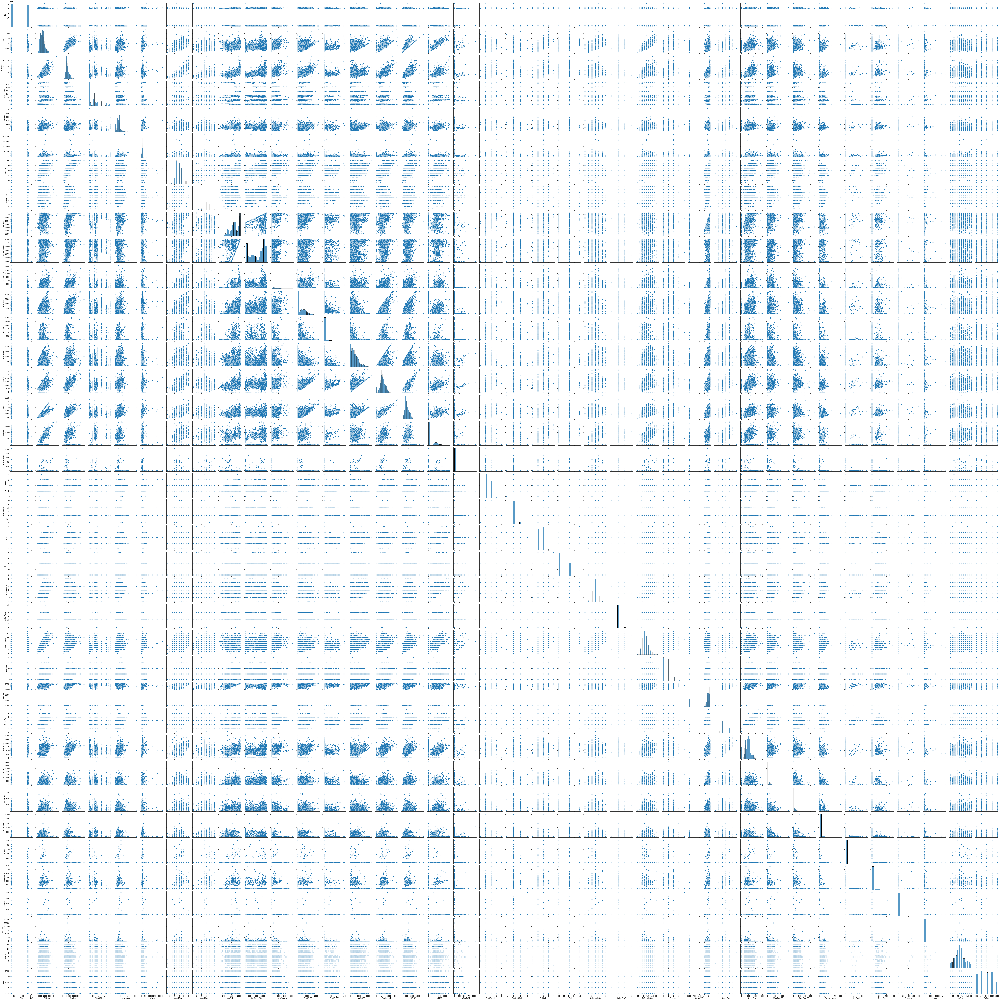

In [246]:
sns.pairplot(housing_fill_drop)

In [290]:
housing_fill_drop['BsmtFinSF1'].value_counts().sort_values(ascending=False)

 0.0       774
 24.0       22
 16.0       12
 288.0       8
 602.0       8
 300.0       8
 20.0        7
 500.0       7
 384.0       7
 700.0       7
 600.0       7
 624.0       7
 456.0       7
 375.0       7
 360.0       7
 276.0       6
 560.0       6
 368.0       6
 468.0       6
 528.0       6
 662.0       6
 625.0       6
 353.0       5
 732.0       5
 550.0       5
 904.0       5
 553.0       5
 336.0       5
 697.0       5
 120.0       5
 144.0       5
 450.0       5
 312.0       5
 588.0       5
 330.0       5
 672.0       5
 104.0       5
 338.0       5
 648.0       5
 547.0       5
 936.0       5
 915.0       5
 686.0       5
 616.0       5
 250.0       5
 400.0       5
 595.0       5
 504.0       5
 637.0       5
 767.0       5
 329.0       4
 60.0        4
 539.0       4
 520.0       4
 828.0       4
 510.0       4
 442.0       4
 507.0       4
 626.0       4
 612.0       4
 1200.0      4
 299.0       4
 1059.0      4
 728.0       4
 56.0        4
 659.0       4
 432.0    

In [289]:
housing_fill_drop['BsmtFinSF2'].shape

(2580,)

<AxesSubplot:xlabel='BldgType', ylabel='SalePrice'>

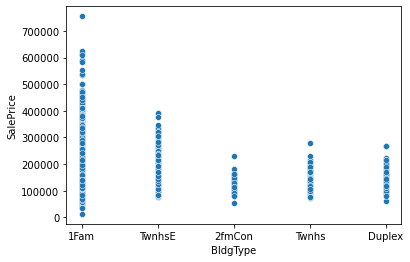

In [324]:
sns.scatterplot(x='BldgType', y='SalePrice', data= housing_fill_drop)

In [327]:
housing_fill_drop['BldgType'].value_counts().sum()

2580

<AxesSubplot:xlabel='BsmtCond', ylabel='SalePrice'>

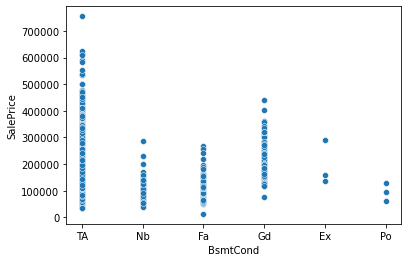

In [328]:
sns.scatterplot(x='BsmtCond', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='BsmtExposure', ylabel='SalePrice'>

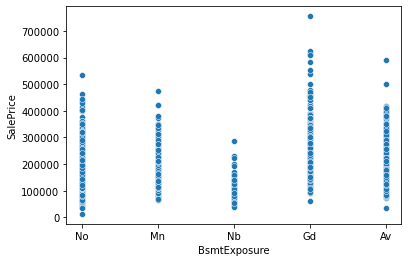

In [329]:
sns.scatterplot(x='BsmtExposure', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='BsmtFinType1', ylabel='SalePrice'>

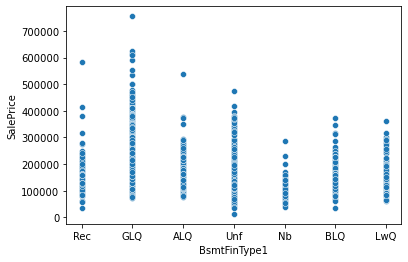

In [330]:
sns.scatterplot(x='BsmtFinType1', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='BsmtFinType2', ylabel='SalePrice'>

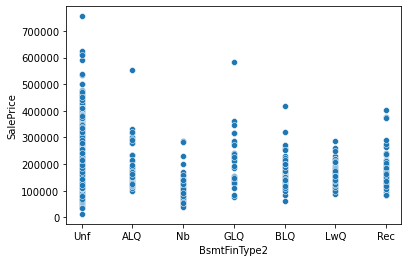

In [331]:
sns.scatterplot(x='BsmtFinType2', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='BsmtQual', ylabel='SalePrice'>

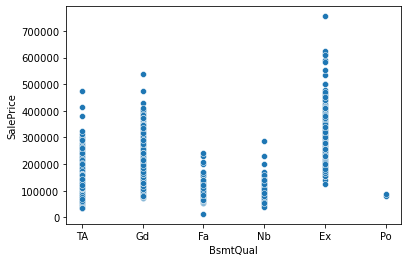

In [333]:
sns.scatterplot(x='BsmtQual', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='CentralAir', ylabel='SalePrice'>

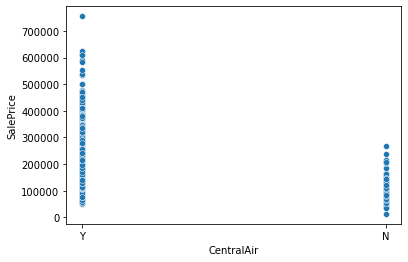

In [334]:
sns.scatterplot(x='CentralAir', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='Condition1', ylabel='SalePrice'>

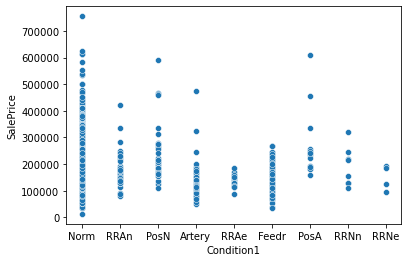

In [335]:
sns.scatterplot(x='Condition1', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='Condition2', ylabel='SalePrice'>

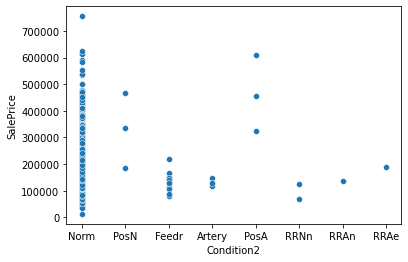

In [336]:
sns.scatterplot(x='Condition2', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='Electrical', ylabel='SalePrice'>

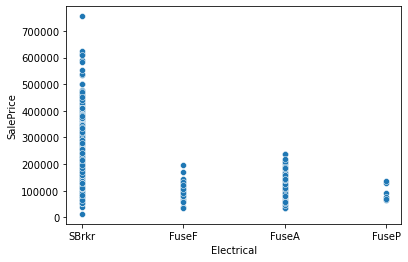

In [337]:
sns.scatterplot(x='Electrical', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='ExterCond', ylabel='SalePrice'>

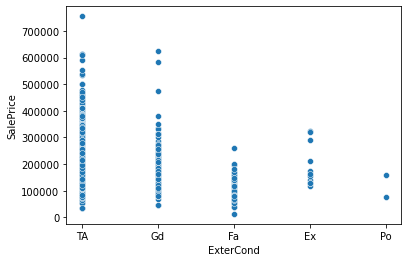

In [338]:
sns.scatterplot(x='ExterCond', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='ExterQual', ylabel='SalePrice'>

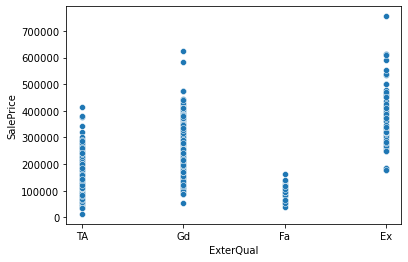

In [339]:
sns.scatterplot(x='ExterQual', y='SalePrice', data= housing_fill_drop)

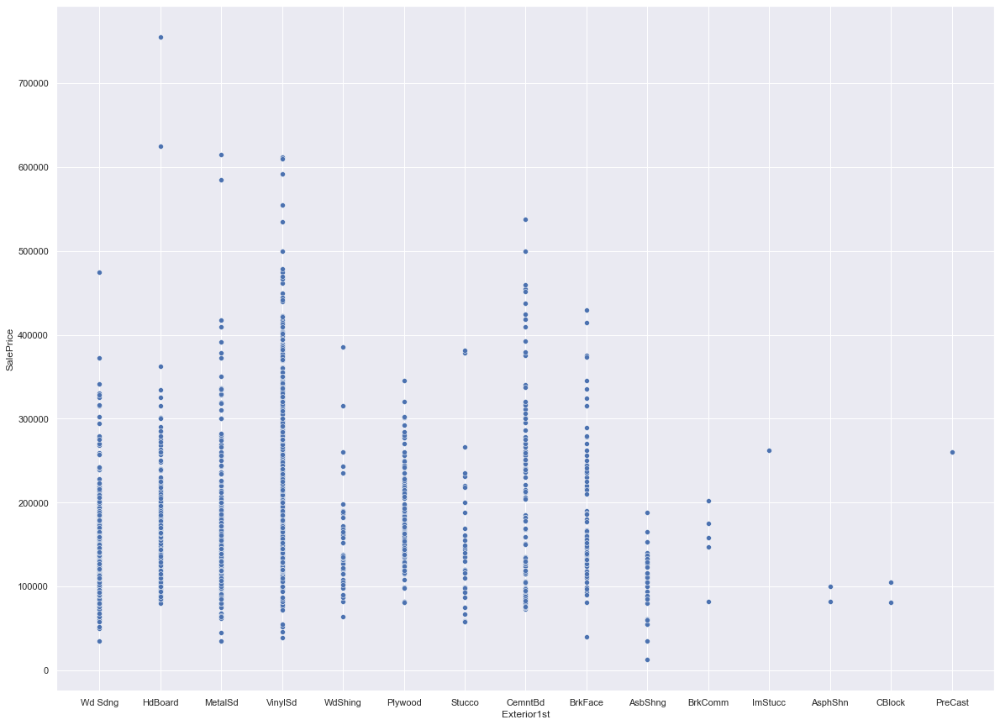

In [343]:
sns.scatterplot(x='Exterior1st', y='SalePrice', data= housing_fill_drop)
sns.set(rc={'figure.figsize':(15,20)})

<AxesSubplot:xlabel='FireplaceQu', ylabel='SalePrice'>

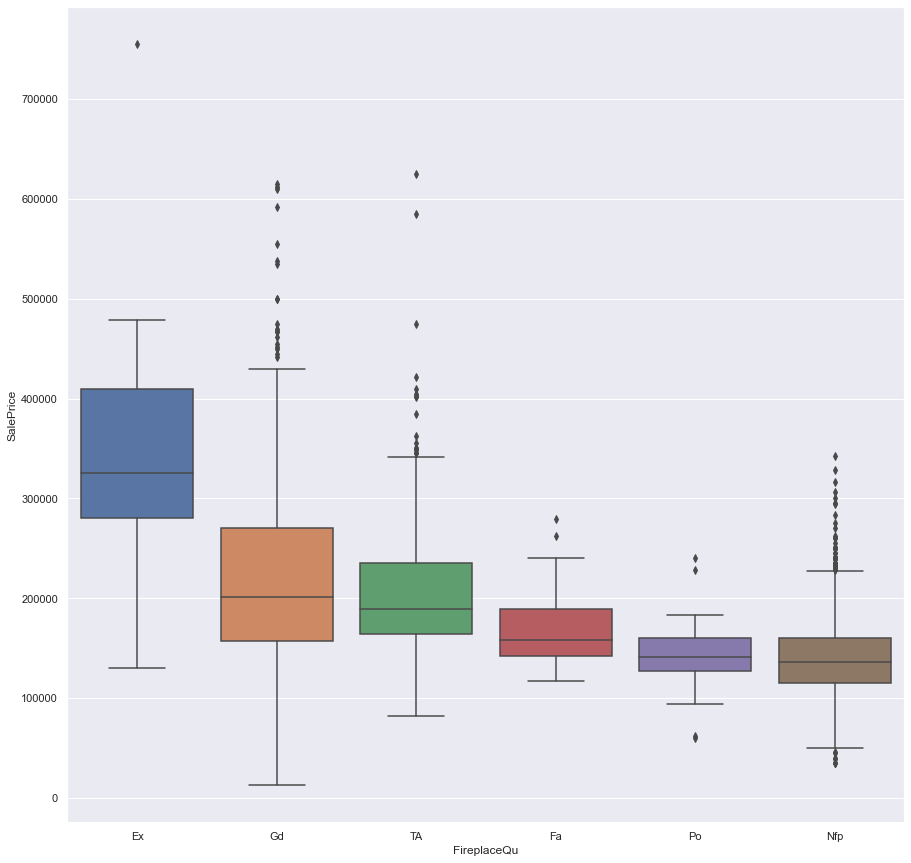

In [380]:
#FireplaceQu
ordered=housing_fill_drop.groupby(by=["FireplaceQu"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='FireplaceQu', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Fireplaces', ylabel='SalePrice'>

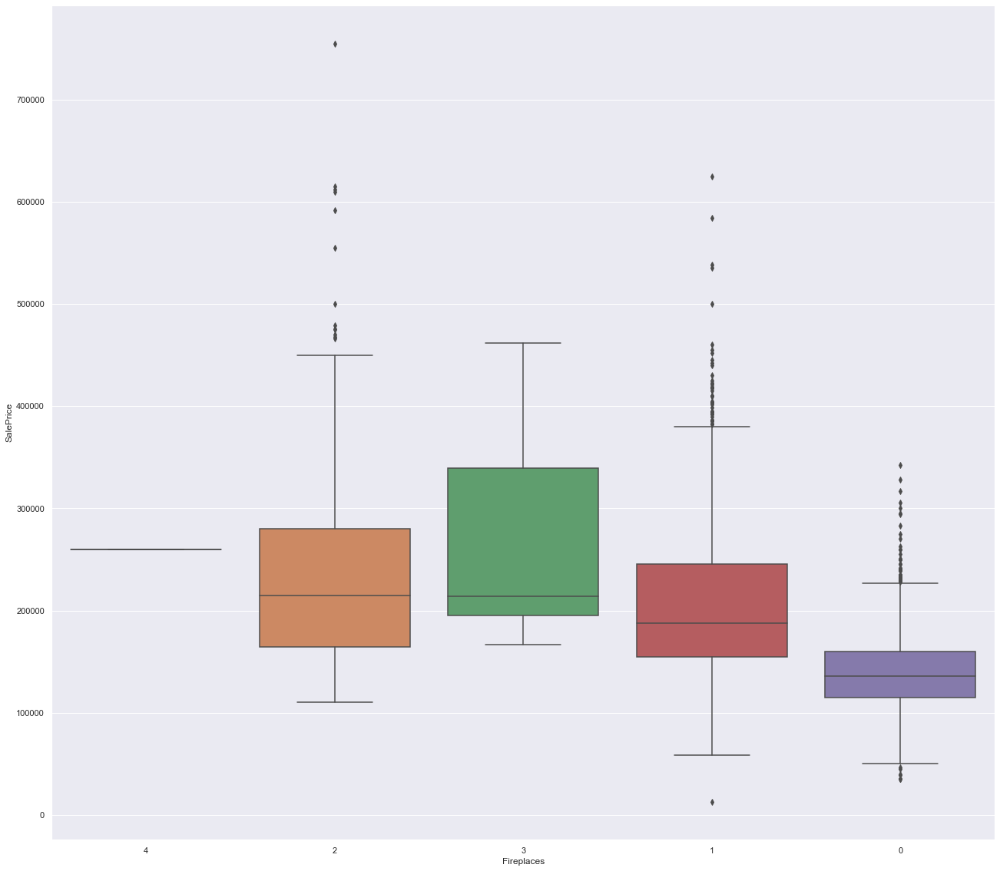

In [470]:
#Fireplaces
ordered=housing_fill_drop.groupby(by=["Fireplaces"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Fireplaces', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Foundation', ylabel='SalePrice'>

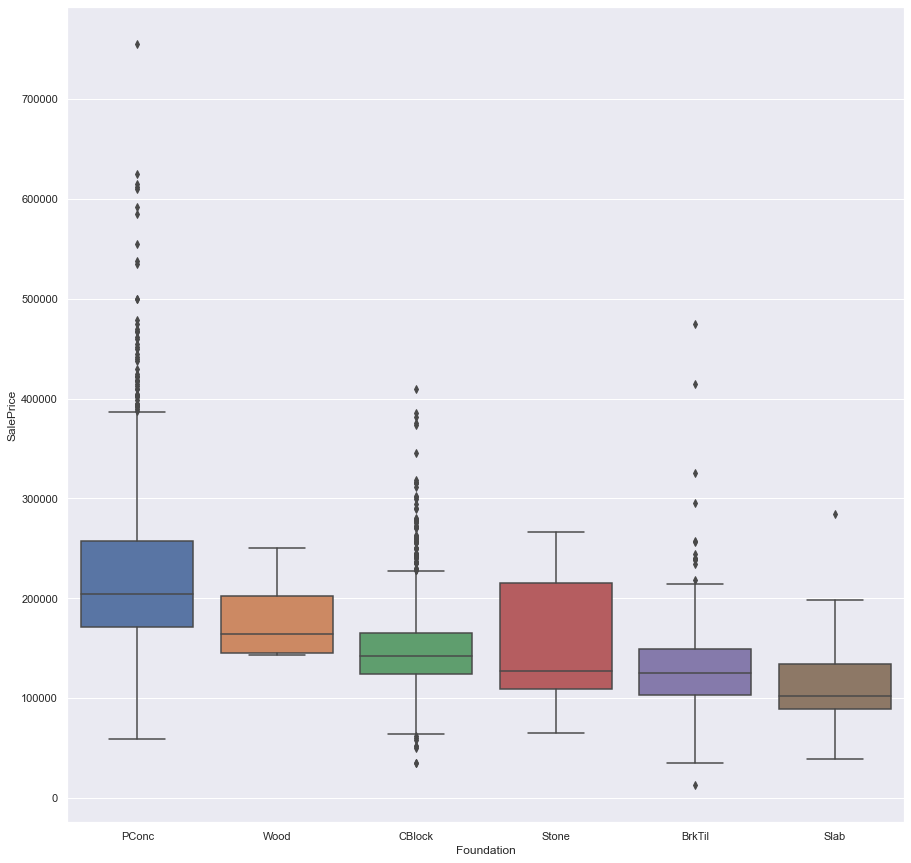

In [384]:
#Foundation
ordered=housing_fill_drop.groupby(by=["Foundation"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Foundation', y='SalePrice', data= housing_fill_drop, order=ordered)

In [476]:
housing_fill_drop['Foundation'].value_counts()

CBlock    1140
PConc     1105
BrkTil     278
Slab        42
Stone       10
Wood         5
Name: Foundation, dtype: int64

<AxesSubplot:xlabel='FullBath', ylabel='SalePrice'>

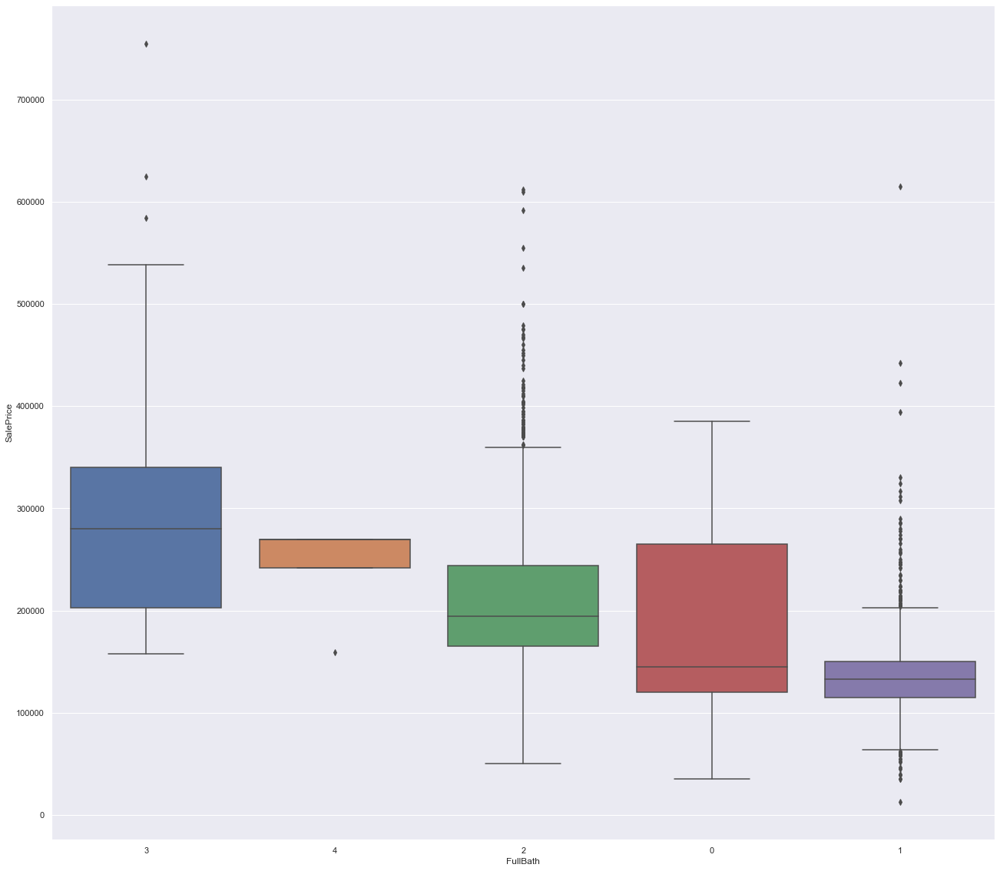

In [471]:
#FullBath
ordered=housing_fill_drop.groupby(by=["FullBath"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='FullBath', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Functional', ylabel='SalePrice'>

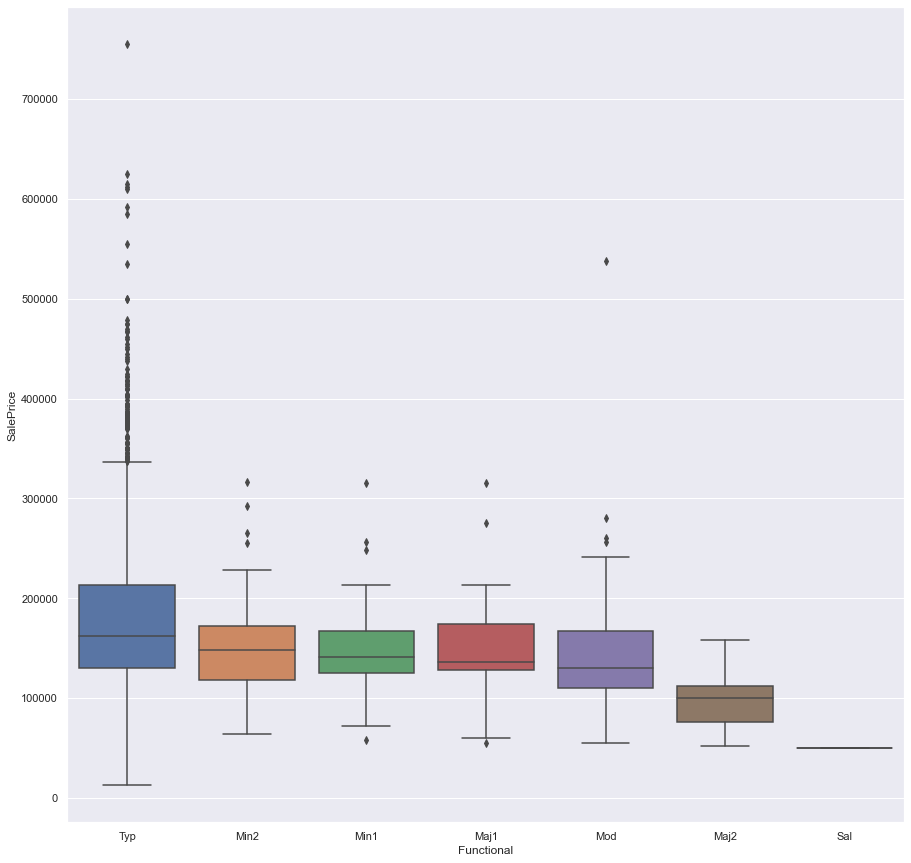

In [383]:
#Functional
ordered=housing_fill_drop.groupby(by=["Functional"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Functional', y='SalePrice', data= housing_fill_drop, order=ordered)

In [477]:
housing_fill_drop.Functional.value_counts()

Typ     2399
Min2      66
Min1      57
Mod       32
Maj1      18
Maj2       7
Sal        1
Name: Functional, dtype: int64

<AxesSubplot:xlabel='HalfBath', ylabel='SalePrice'>

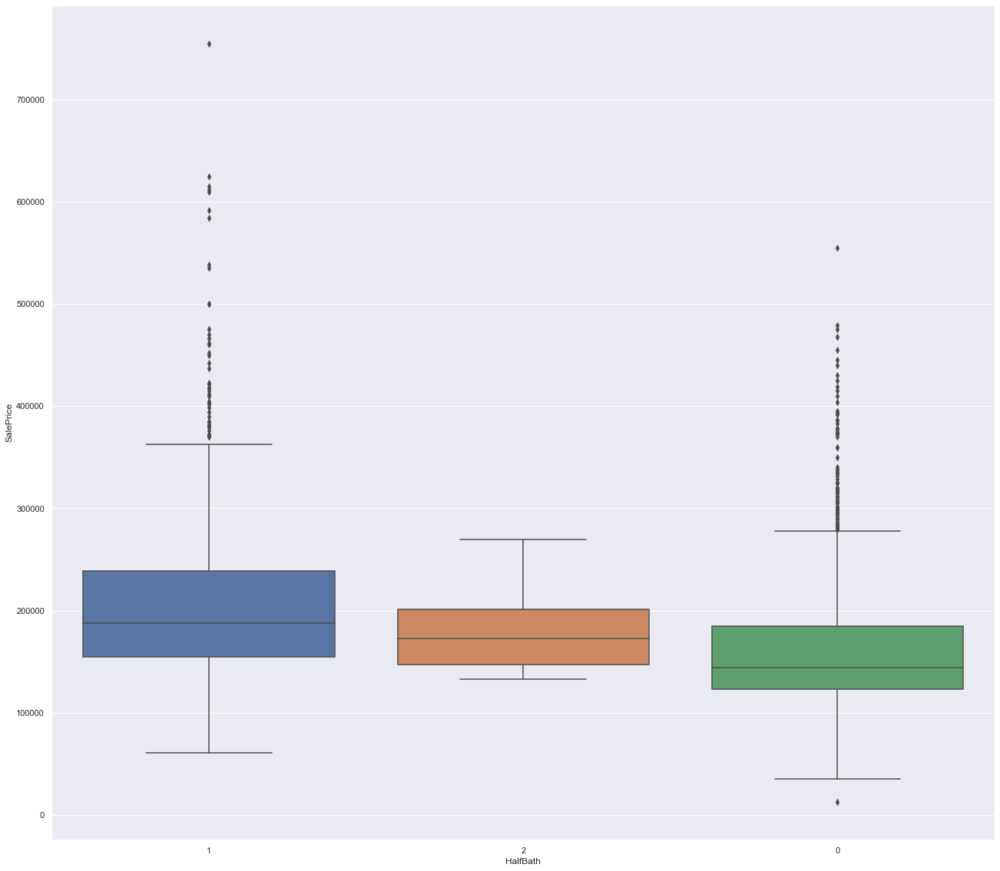

In [472]:
#HalfBath
ordered=housing_fill_drop.groupby(by=["HalfBath"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='HalfBath', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Heating', ylabel='SalePrice'>

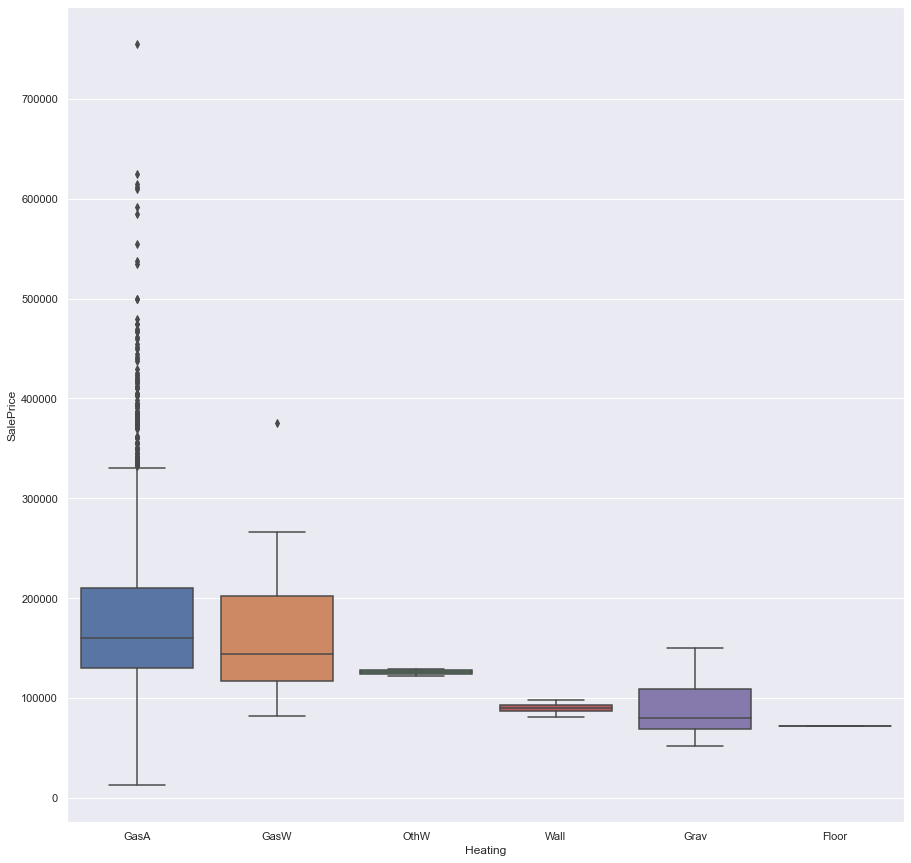

In [391]:
#HEATING
ordered=housing_fill_drop.groupby(by=["Heating"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Heating', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='HeatingQC', ylabel='SalePrice'>

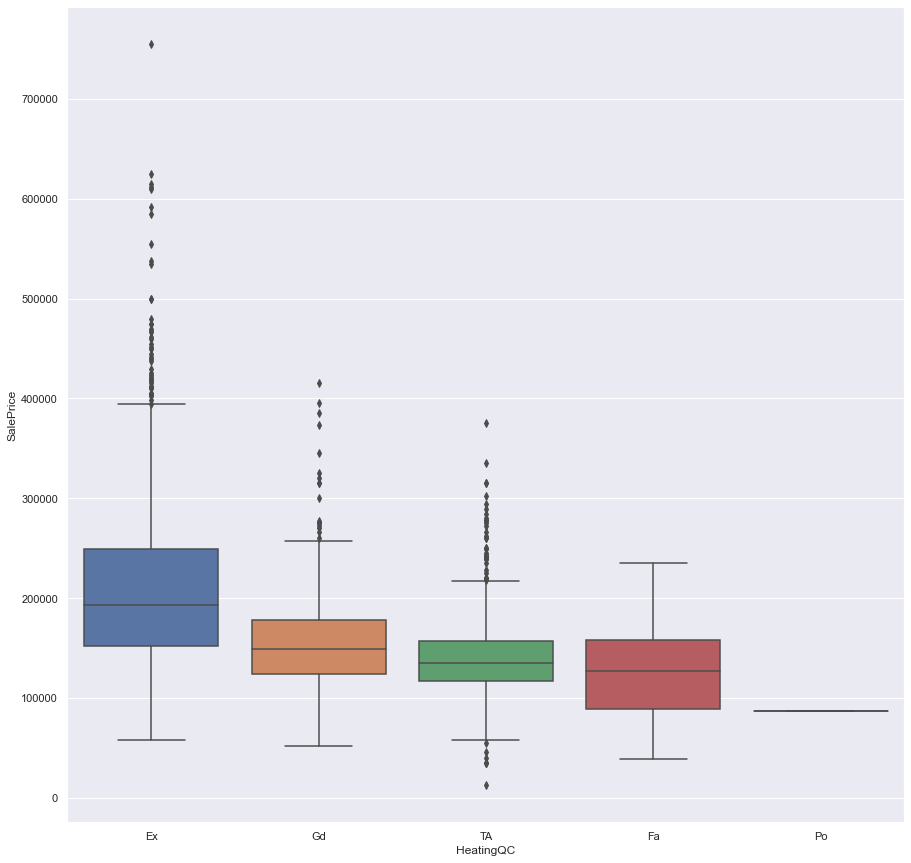

In [392]:
#HeatingQC
ordered=housing_fill_drop.groupby(by=["HeatingQC"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='HeatingQC', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='HouseStyle', ylabel='SalePrice'>

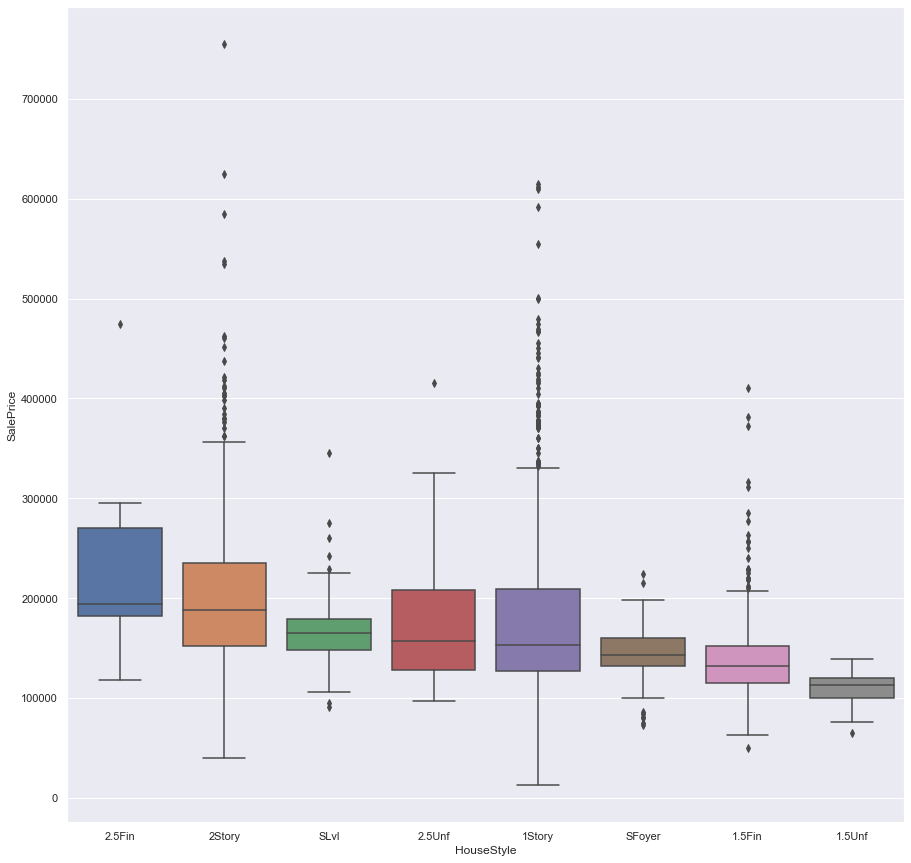

In [393]:
#HOUSEStyle
ordered=housing_fill_drop.groupby(by=["HouseStyle"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='HouseStyle', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='LandContour', ylabel='SalePrice'>

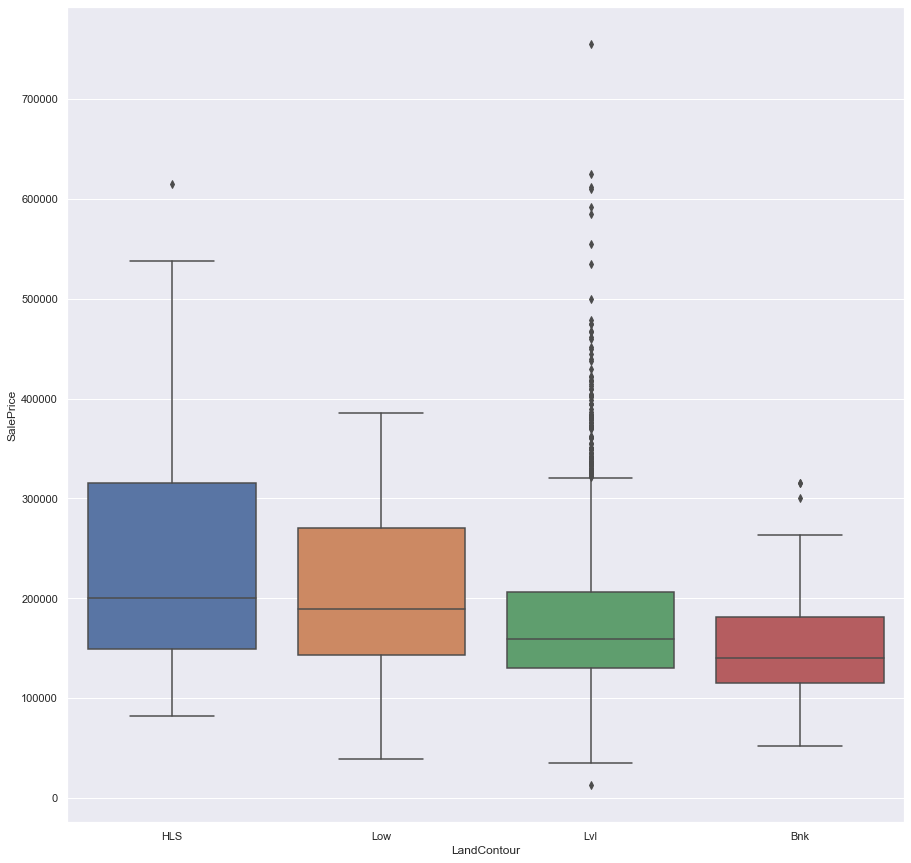

In [395]:
# LOT CHARCTERISTICS
ordered=housing_fill_drop.groupby(by=["LandContour"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='LandContour', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='LandSlope', ylabel='SalePrice'>

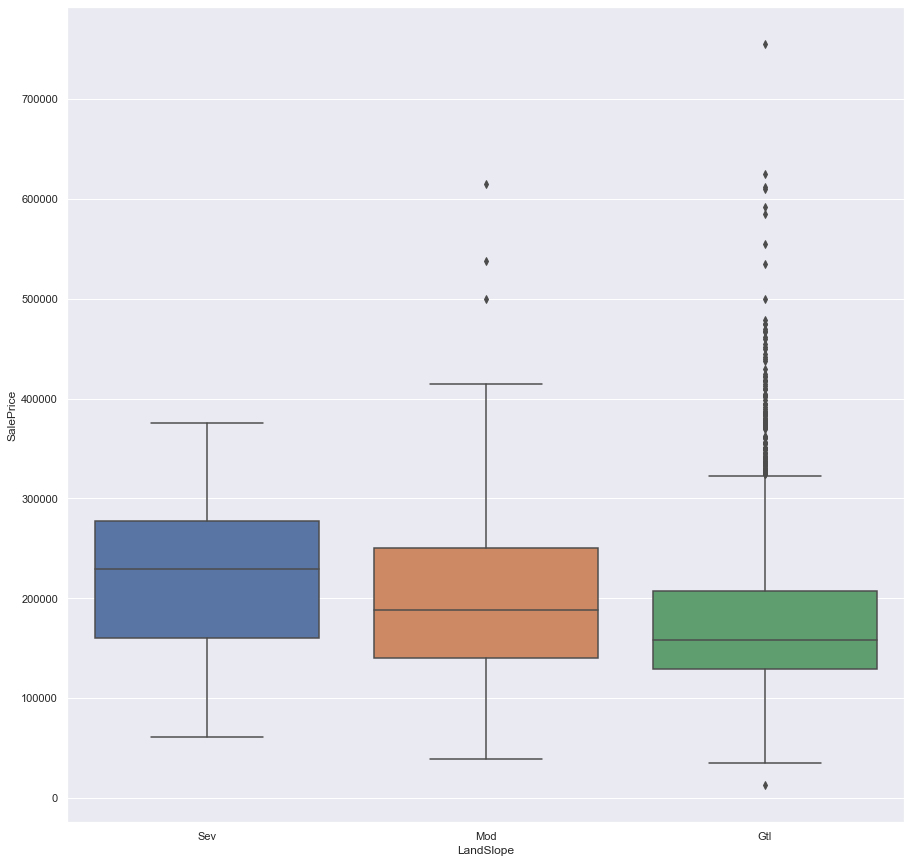

In [396]:
# LOT CHARCTERISTICS
ordered=housing_fill_drop.groupby(by=["LandSlope"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='LandSlope', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='LotConfig', ylabel='SalePrice'>

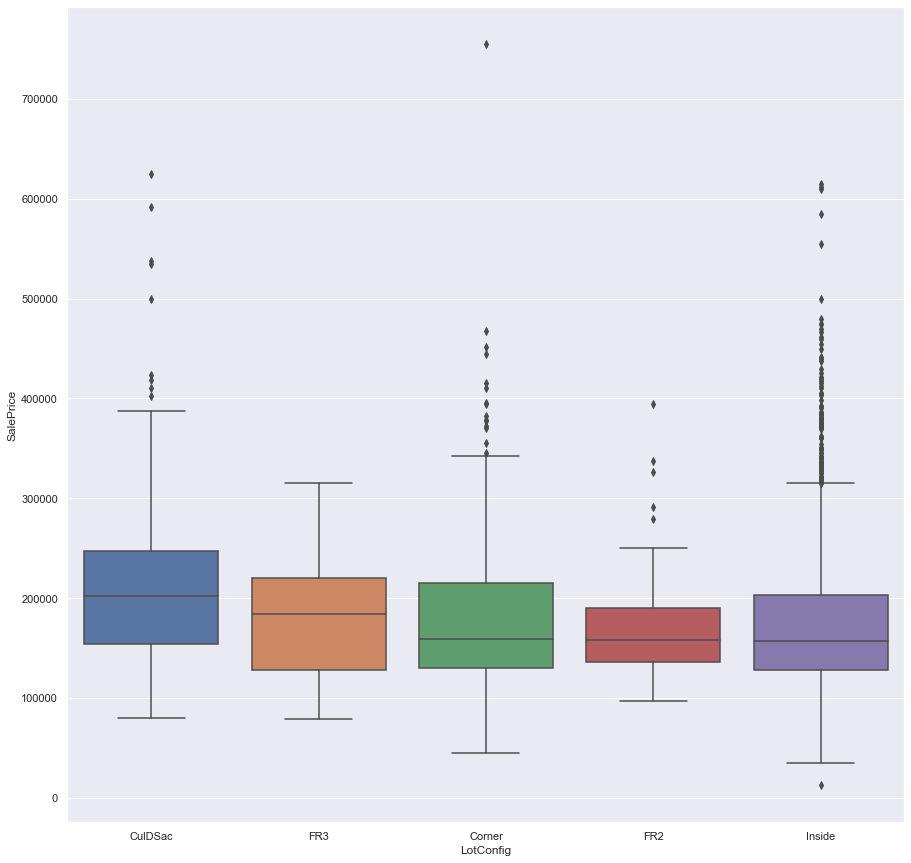

In [397]:
# LOT CHARCTERISTICS
ordered=housing_fill_drop.groupby(by=["LotConfig"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='LotConfig', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='LotShape', ylabel='SalePrice'>

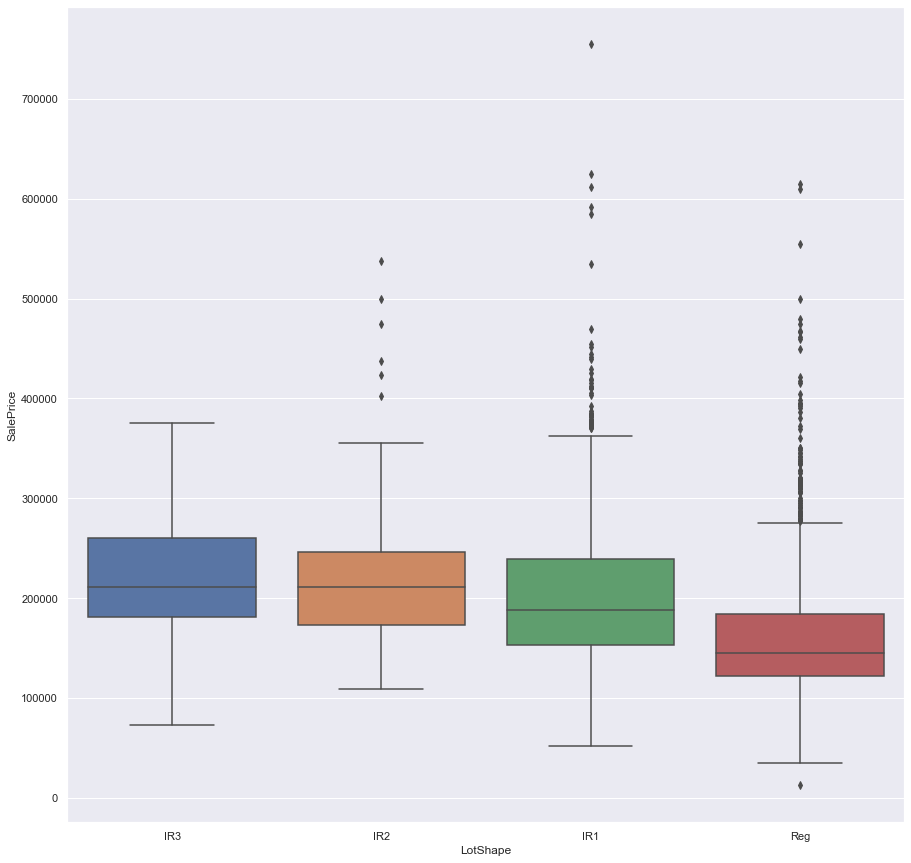

In [398]:
# LOT CHARCTERISTICS
ordered=housing_fill_drop.groupby(by=["LotShape"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='LotShape', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='MasVnrType', ylabel='SalePrice'>

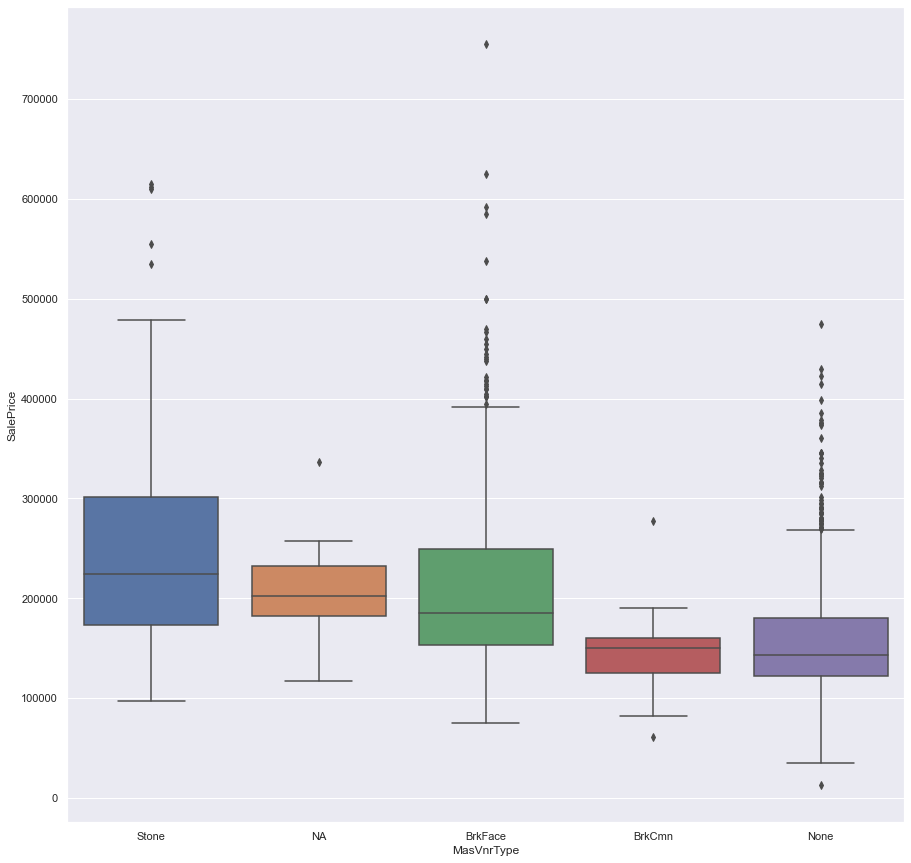

In [400]:
#MasVnrType
ordered=housing_fill_drop.groupby(by=["MasVnrType"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='MasVnrType', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='MSSubClass', ylabel='SalePrice'>

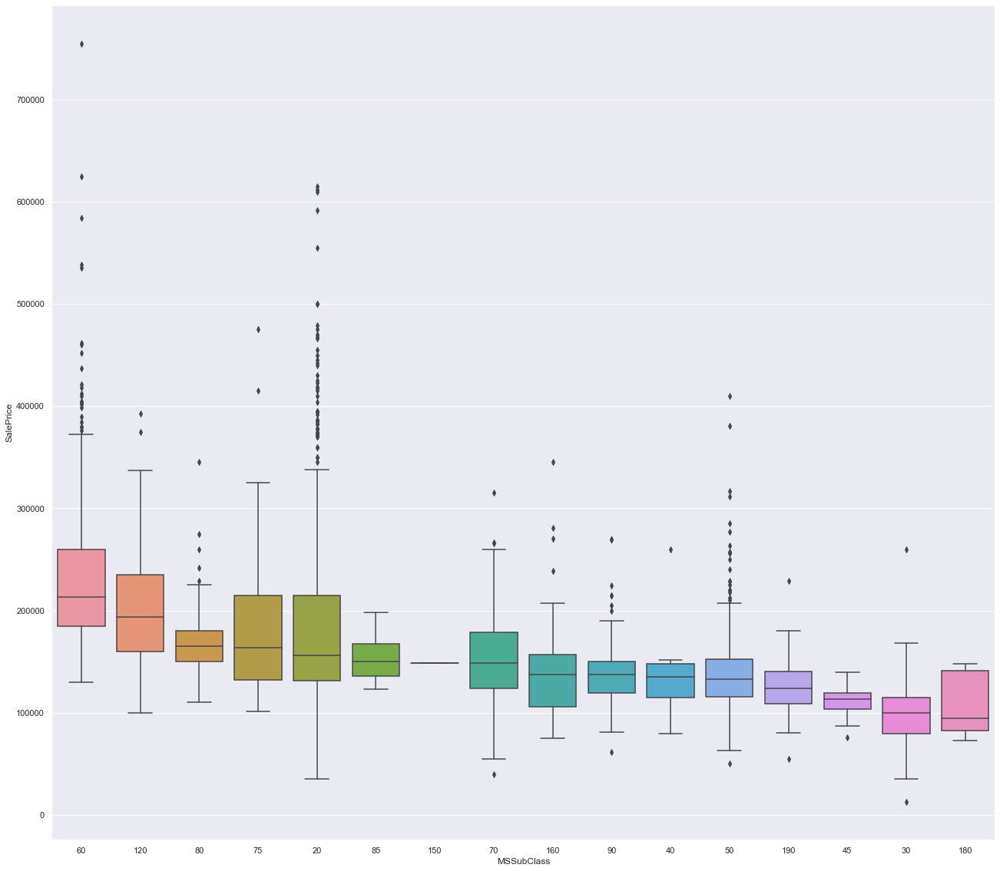

In [473]:
#MSSubClass
ordered=housing_fill_drop.groupby(by=["MSSubClass"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='MSSubClass', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='MSZoning', ylabel='SalePrice'>

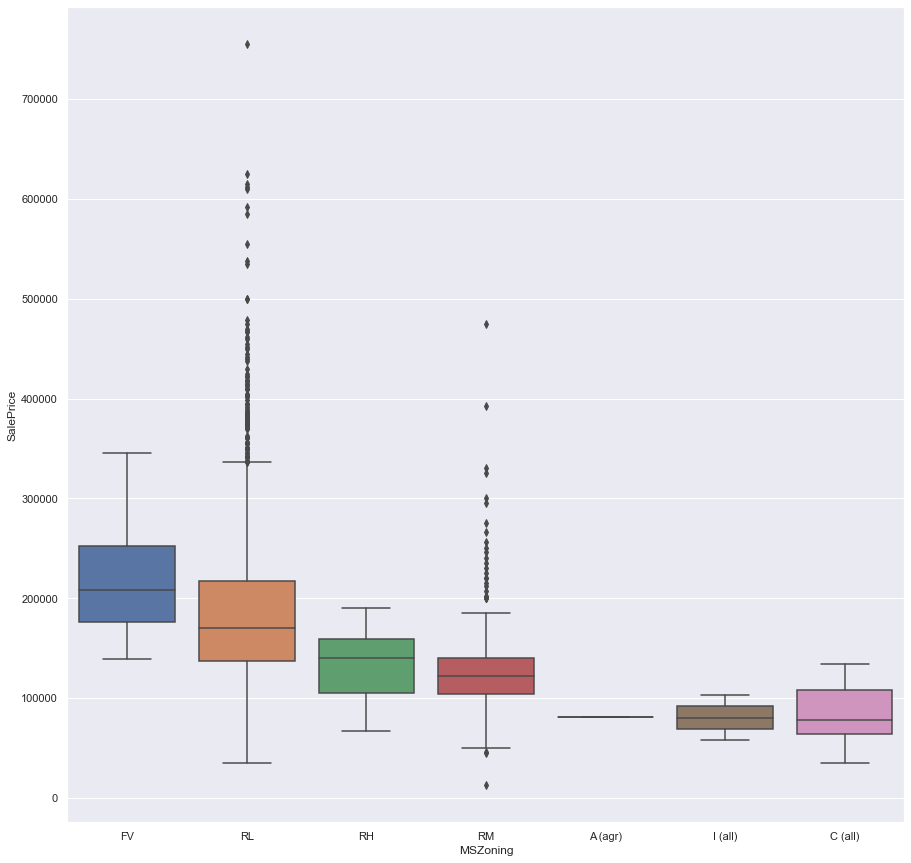

In [399]:
#NEIGHBORHOOD
ordered=housing_fill_drop.groupby(by=["MSZoning"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='MSZoning', y='SalePrice', data= housing_fill_drop, order=ordered)

In [403]:
housing['MasVnrType'].value_counts()

None       1559
BrkFace     804
Stone       183
BrkCmn       20
Name: MasVnrType, dtype: int64

<AxesSubplot:xlabel='Neighborhood', ylabel='SalePrice'>

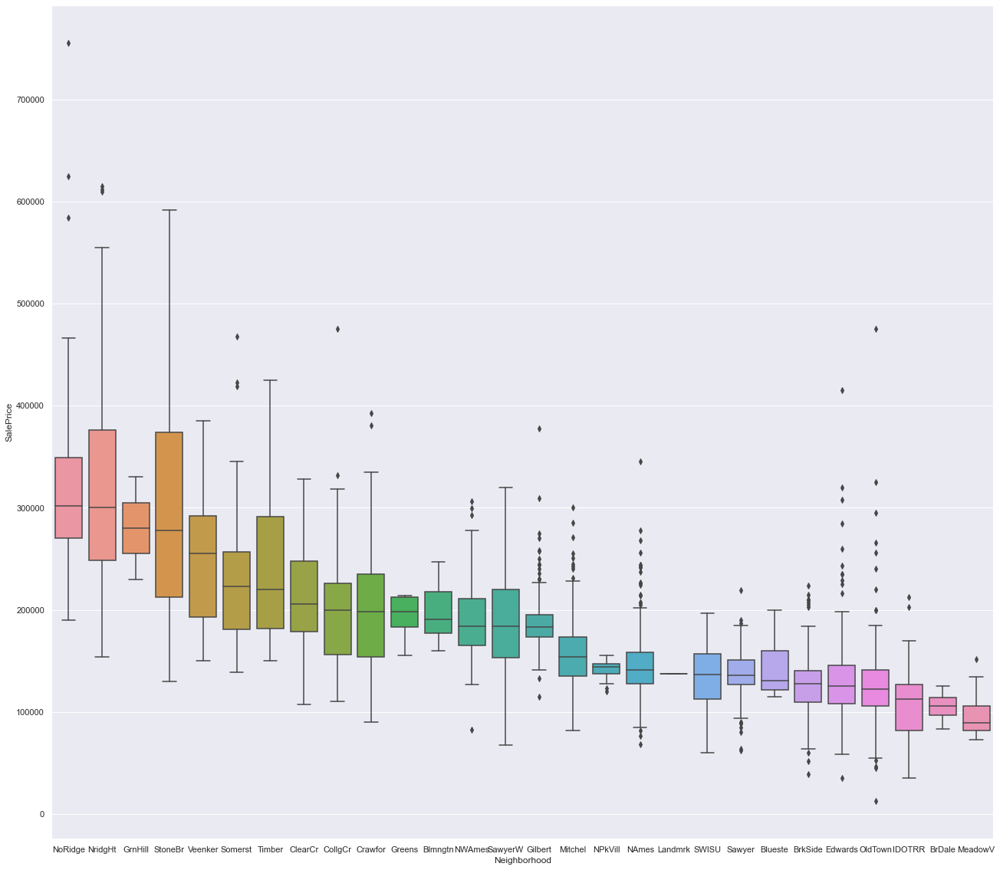

In [409]:
sns.set(rc={'figure.figsize':(22,20)})
ordered=housing_fill_drop.groupby(by=["Neighborhood"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Neighborhood', y='SalePrice', data= housing_fill_drop, order=ordered)

In [407]:
housing['Neighborhood'].value_counts()

NAmes      410
CollgCr    236
OldTown    213
Edwards    165
Gilbert    143
Somerst    143
Sawyer     139
NWAmes     123
NridgHt    121
SawyerW    113
Mitchel    104
BrkSide    103
Crawfor     93
IDOTRR      76
NoRidge     67
Timber      54
StoneBr     43
SWISU       42
ClearCr     40
MeadowV     34
BrDale      29
Veenker     23
Blmngtn     23
NPkVill     22
Blueste     10
Greens       8
GrnHill      2
Landmrk      1
Name: Neighborhood, dtype: int64

<AxesSubplot:xlabel='PavedDrive', ylabel='SalePrice'>

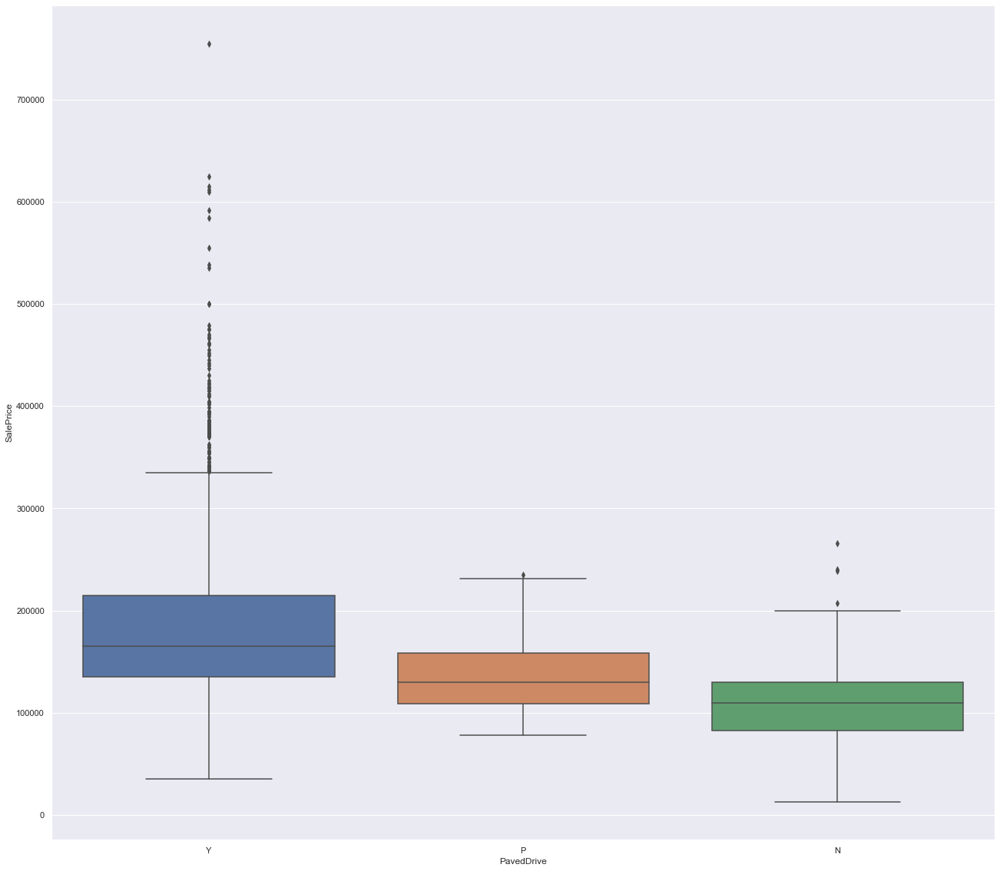

In [410]:
ordered=housing_fill_drop.groupby(by=["PavedDrive"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='PavedDrive', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='RoofMatl', ylabel='SalePrice'>

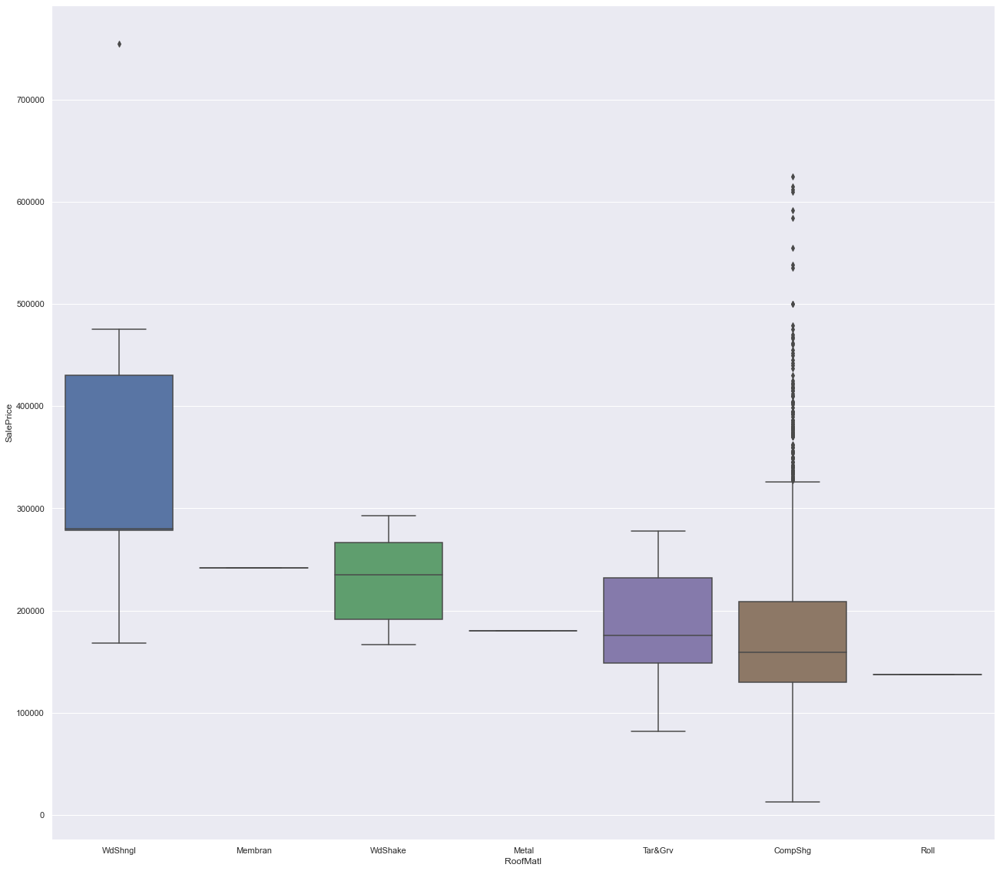

In [411]:
ordered=housing_fill_drop.groupby(by=["RoofMatl"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='RoofMatl', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='RoofStyle', ylabel='SalePrice'>

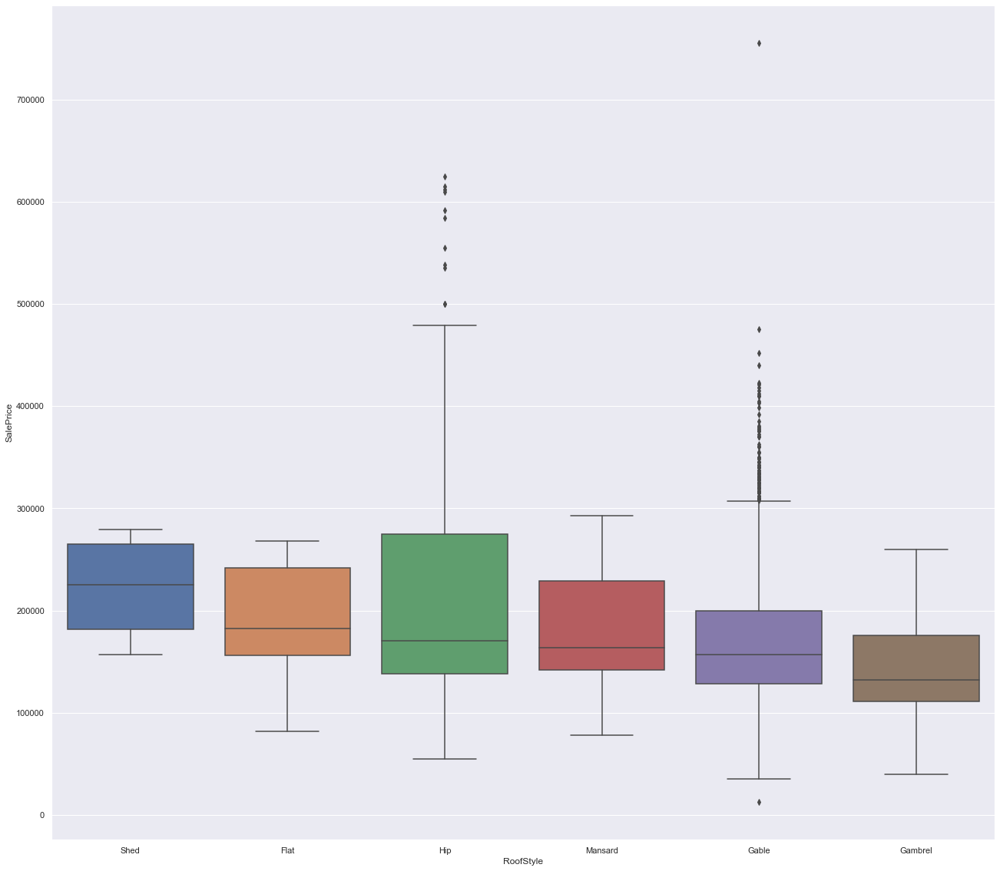

In [412]:
ordered=housing_fill_drop.groupby(by=["RoofStyle"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='RoofStyle', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='SaleCondition', ylabel='SalePrice'>

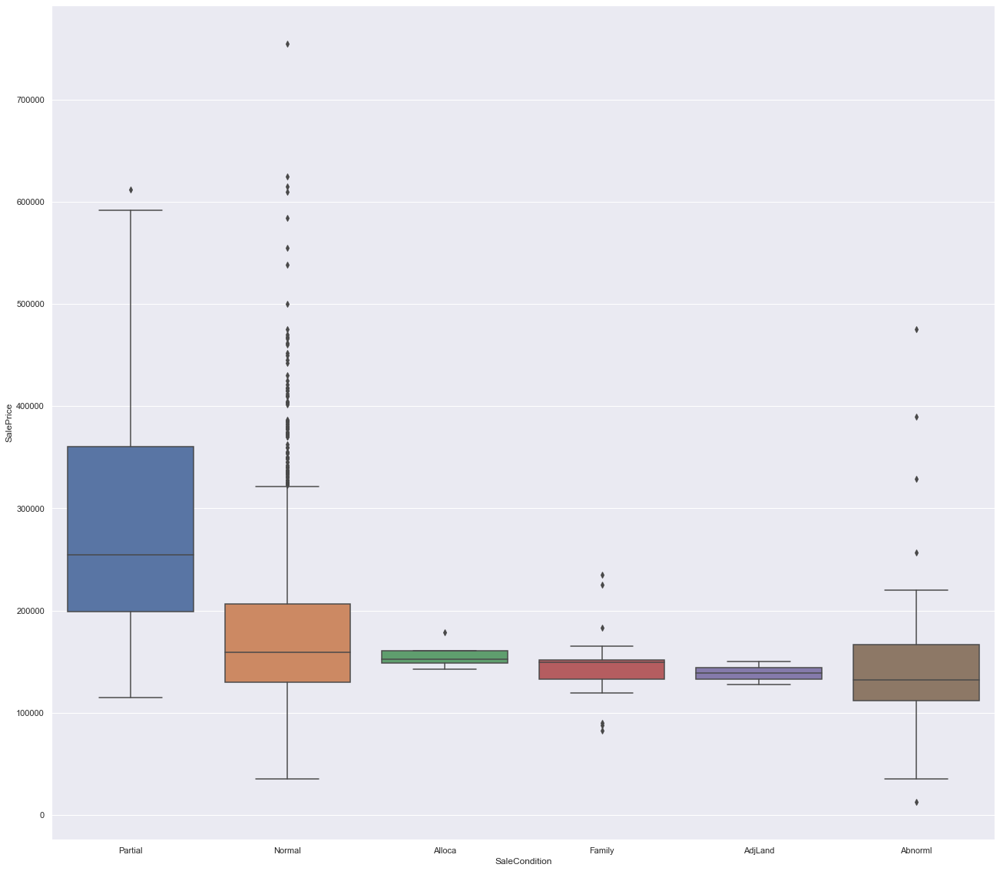

In [415]:
ordered=housing_fill_drop.groupby(by=["SaleCondition"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='SaleCondition', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='SaleType', ylabel='SalePrice'>

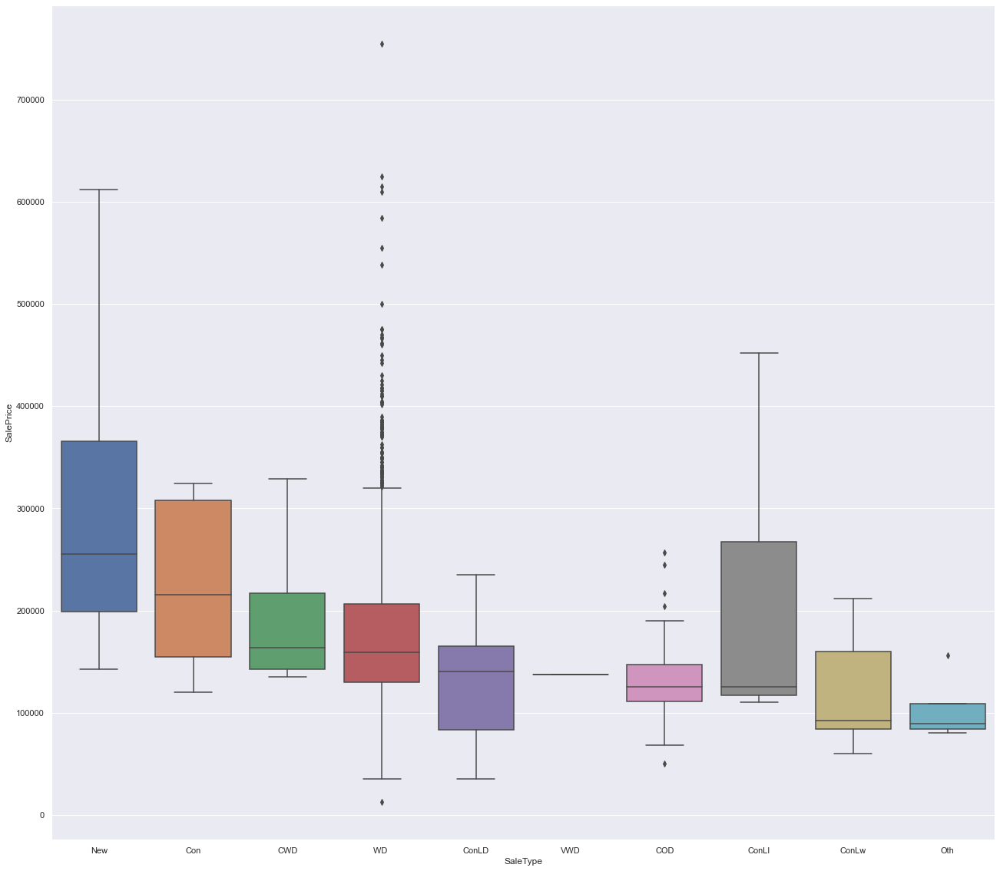

In [416]:
ordered=housing_fill_drop.groupby(by=["SaleType"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='SaleType', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Street', ylabel='SalePrice'>

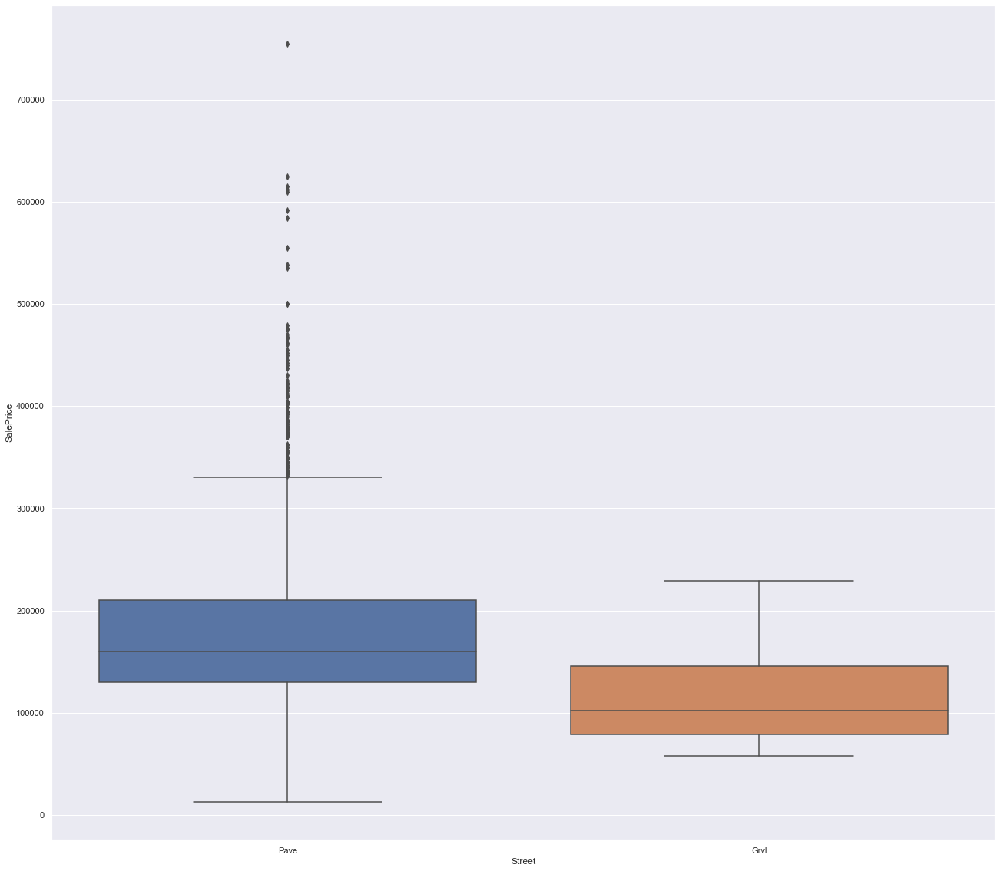

In [417]:
ordered=housing_fill_drop.groupby(by=["Street"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Street', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Utilities', ylabel='SalePrice'>

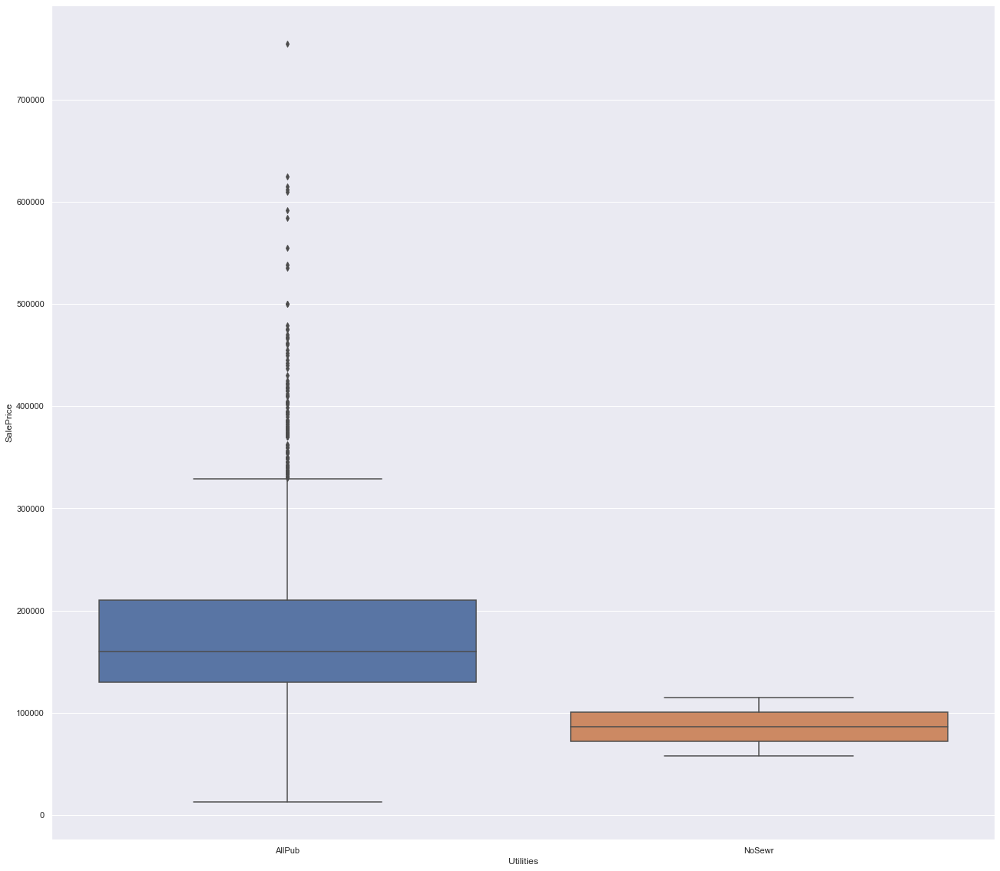

In [418]:
ordered=housing_fill_drop.groupby(by=["Utilities"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Utilities', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Alley', ylabel='SalePrice'>

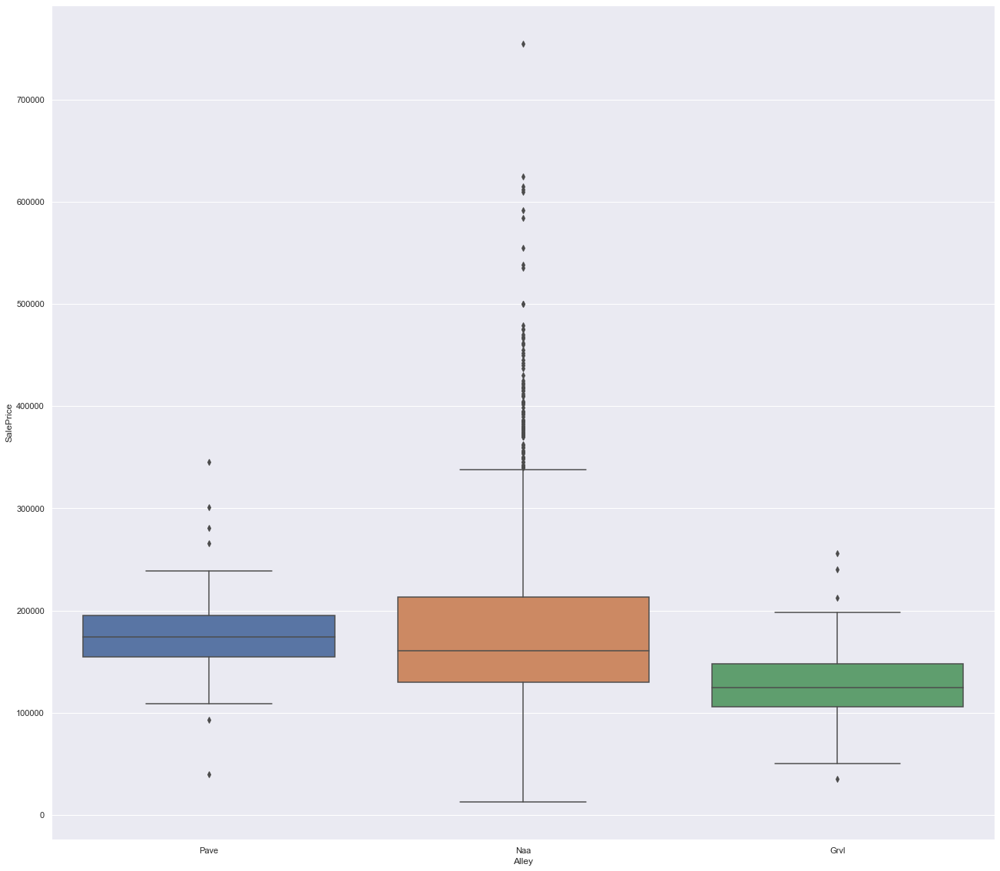

In [419]:
#Alley
ordered=housing_fill_drop.groupby(by=["Alley"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Alley', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='BldgType', ylabel='SalePrice'>

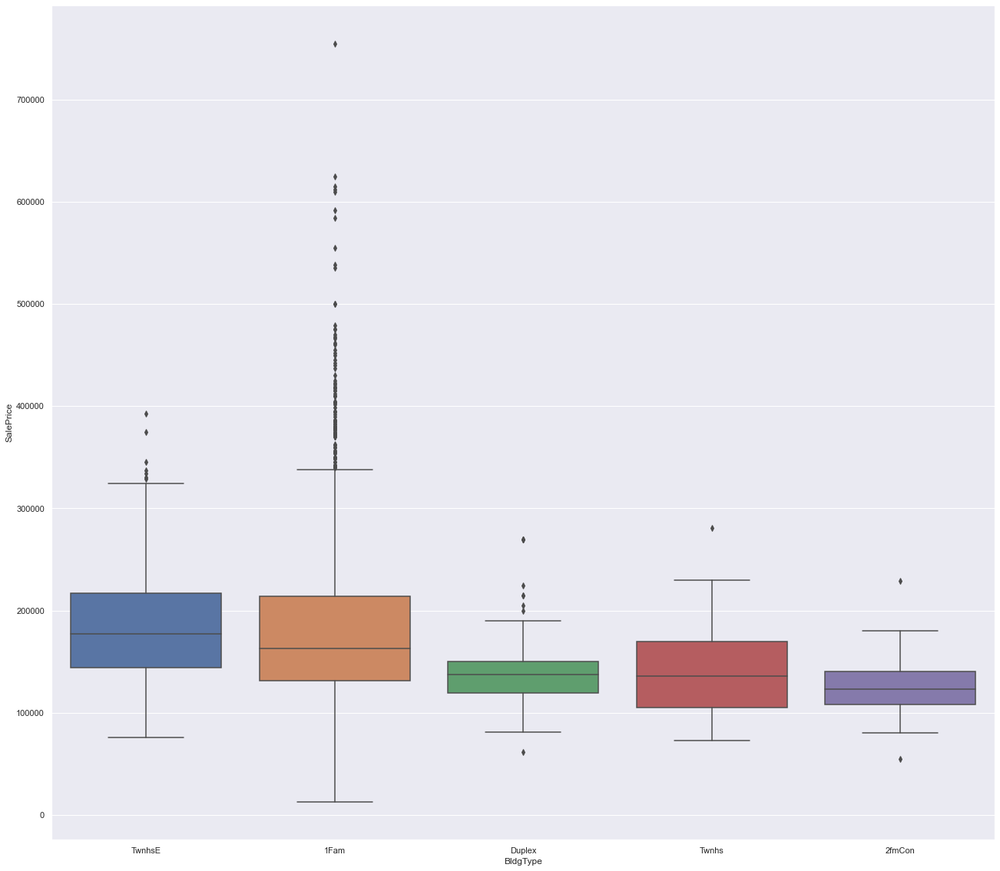

In [423]:
#Bldg Type
ordered=housing_fill_drop.groupby(by=["BldgType"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='BldgType', y='SalePrice', data= housing_fill_drop, order=ordered) 

In [422]:
housing_fill_drop['Alley'].value_counts()

Naa     2412
Grvl     105
Pave      63
Name: Alley, dtype: int64

<AxesSubplot:xlabel='BsmtCond', ylabel='SalePrice'>

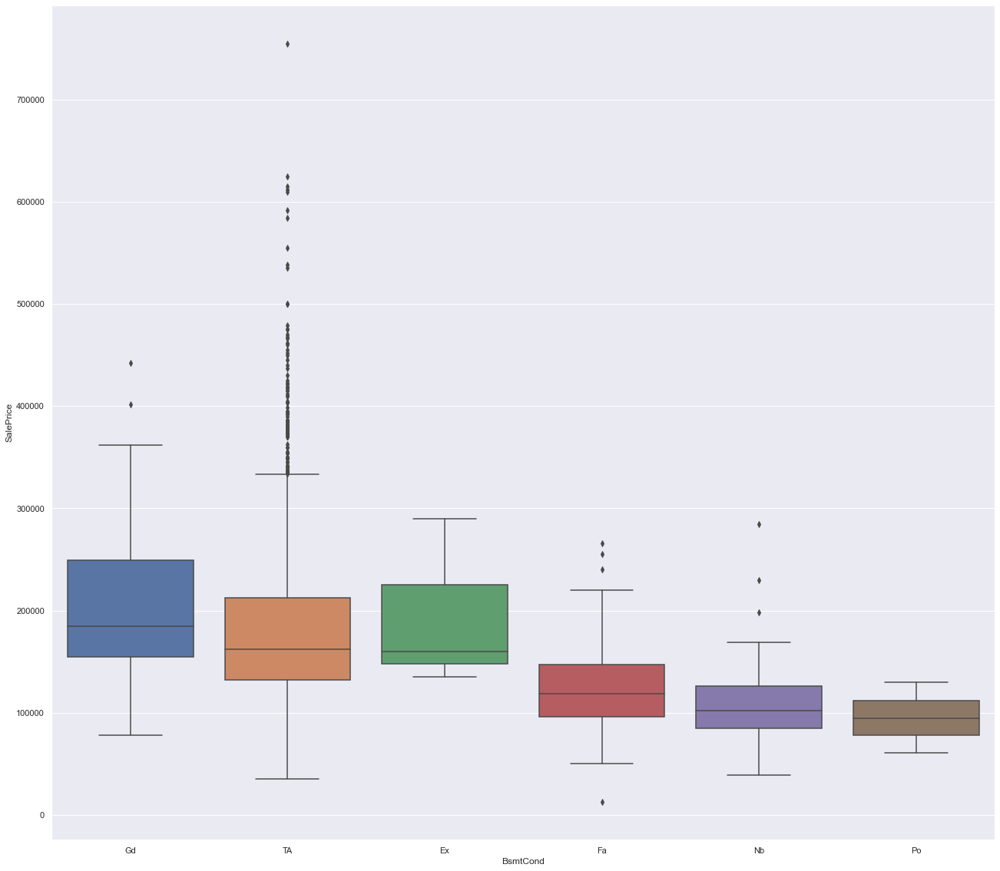

In [424]:
# BASEMENT
ordered=housing_fill_drop.groupby(by=["BsmtCond"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='BsmtCond', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='BsmtExposure', ylabel='SalePrice'>

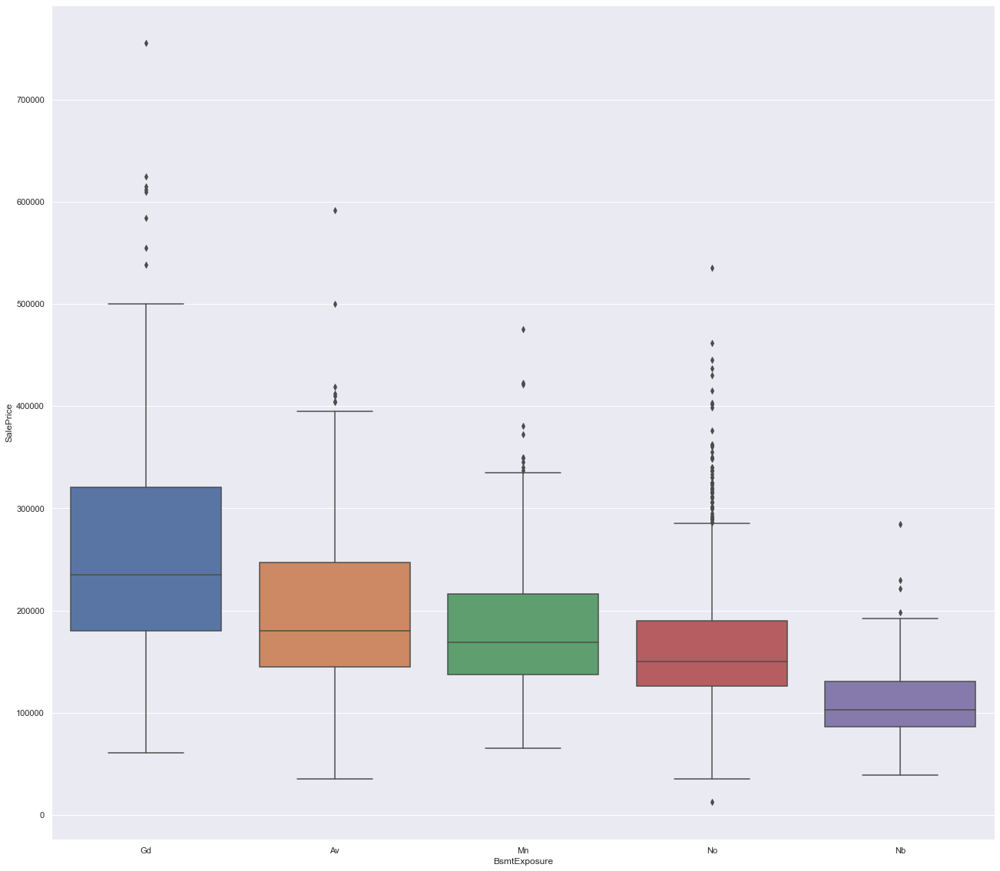

In [425]:
ordered=housing_fill_drop.groupby(by=["BsmtExposure"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='BsmtExposure', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='BsmtFinSF1', ylabel='SalePrice'>

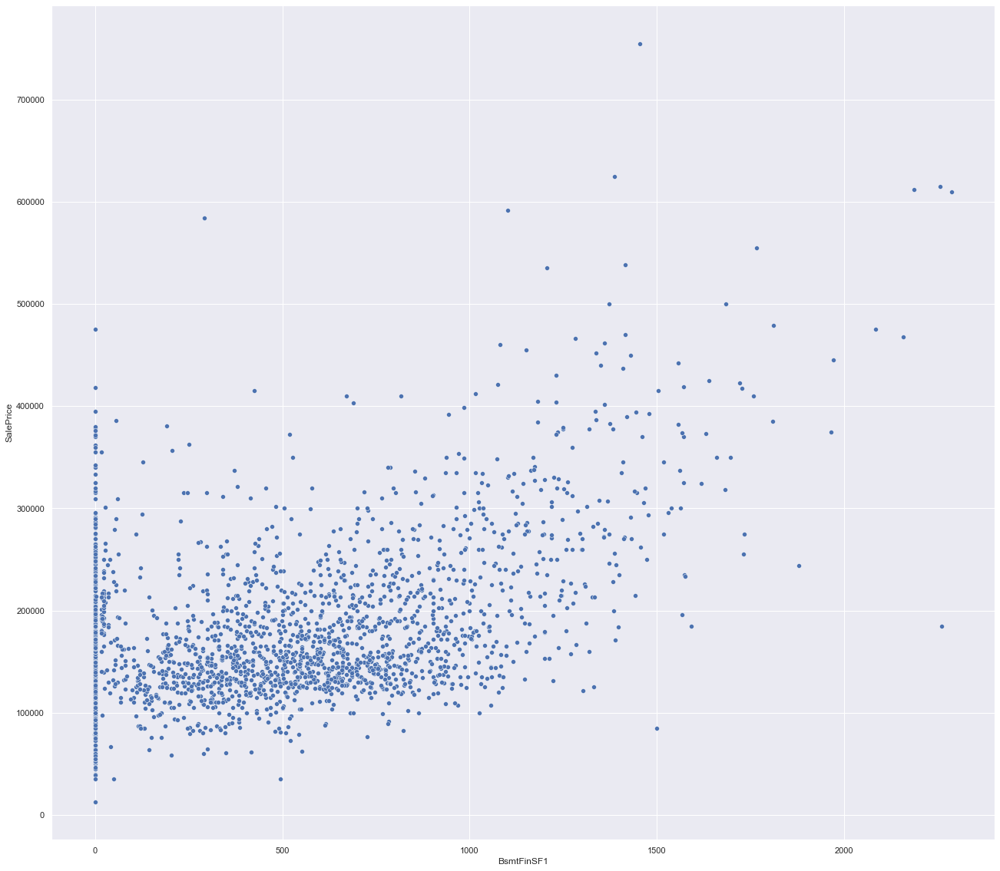

In [427]:
sns.scatterplot(x='BsmtFinSF1', y='SalePrice', data= housing_fill_drop) 

<AxesSubplot:xlabel='BsmtFinSF2', ylabel='SalePrice'>

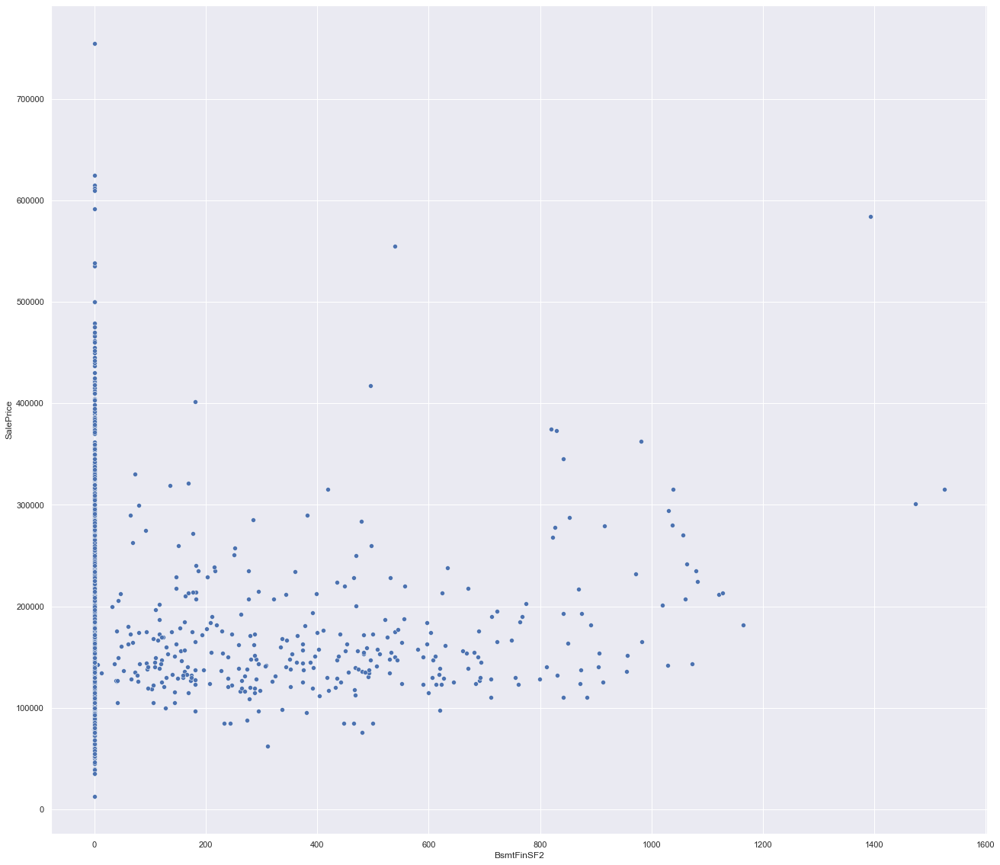

In [428]:
sns.scatterplot(x='BsmtFinSF2', y='SalePrice', data= housing_fill_drop) 

<AxesSubplot:xlabel='BsmtUnfSF', ylabel='SalePrice'>

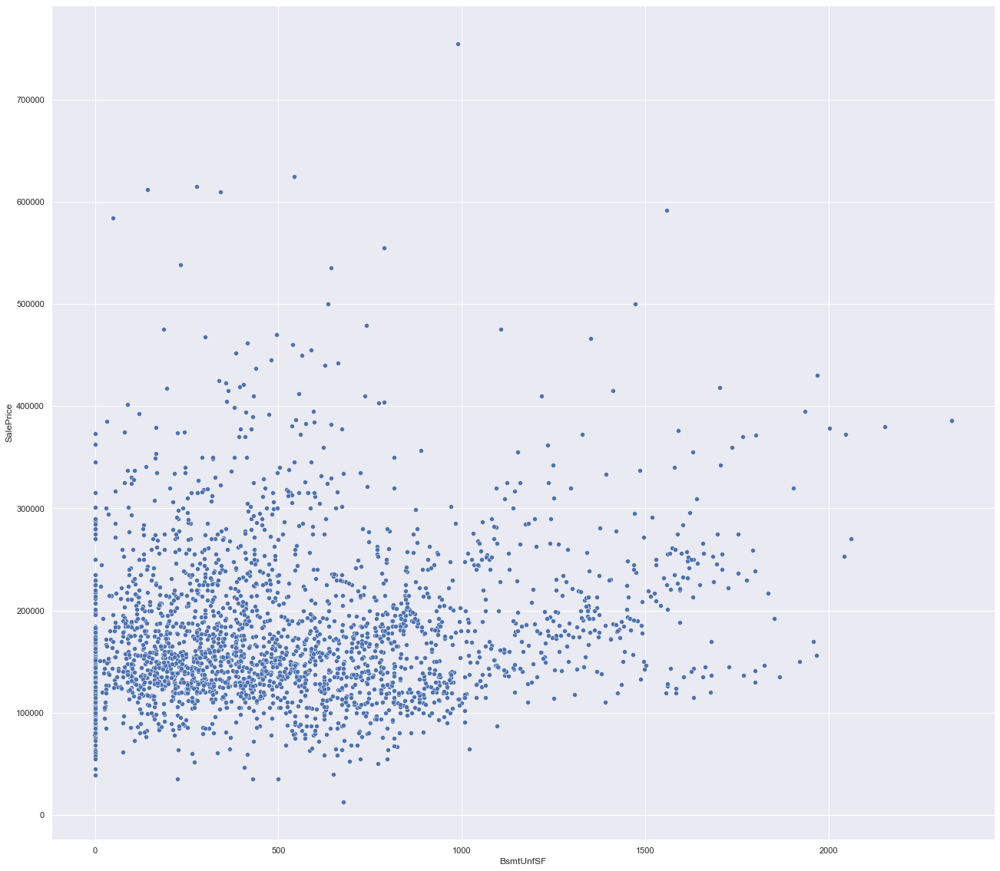

In [429]:
sns.scatterplot(x='BsmtUnfSF', y='SalePrice', data= housing_fill_drop) 

<AxesSubplot:xlabel='TotalBsmtSF', ylabel='SalePrice'>

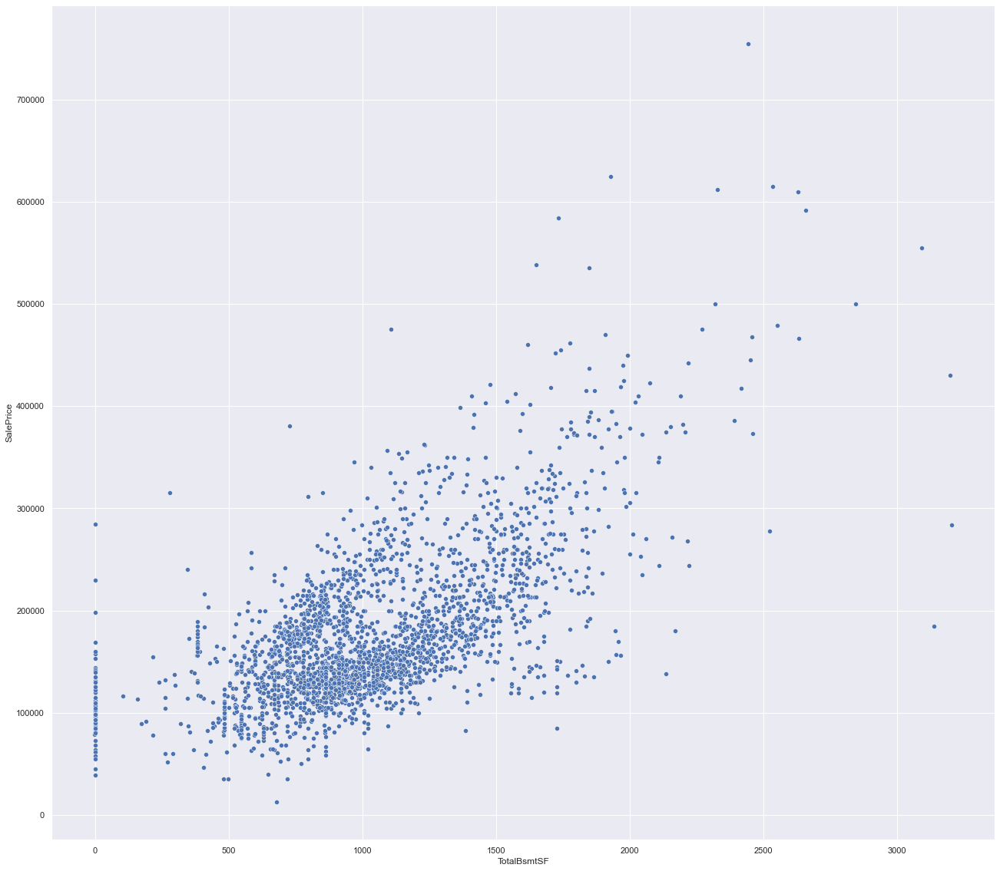

In [431]:
sns.scatterplot(x='TotalBsmtSF', y='SalePrice', data= housing_fill_drop) 

<AxesSubplot:xlabel='BsmtFinType1', ylabel='SalePrice'>

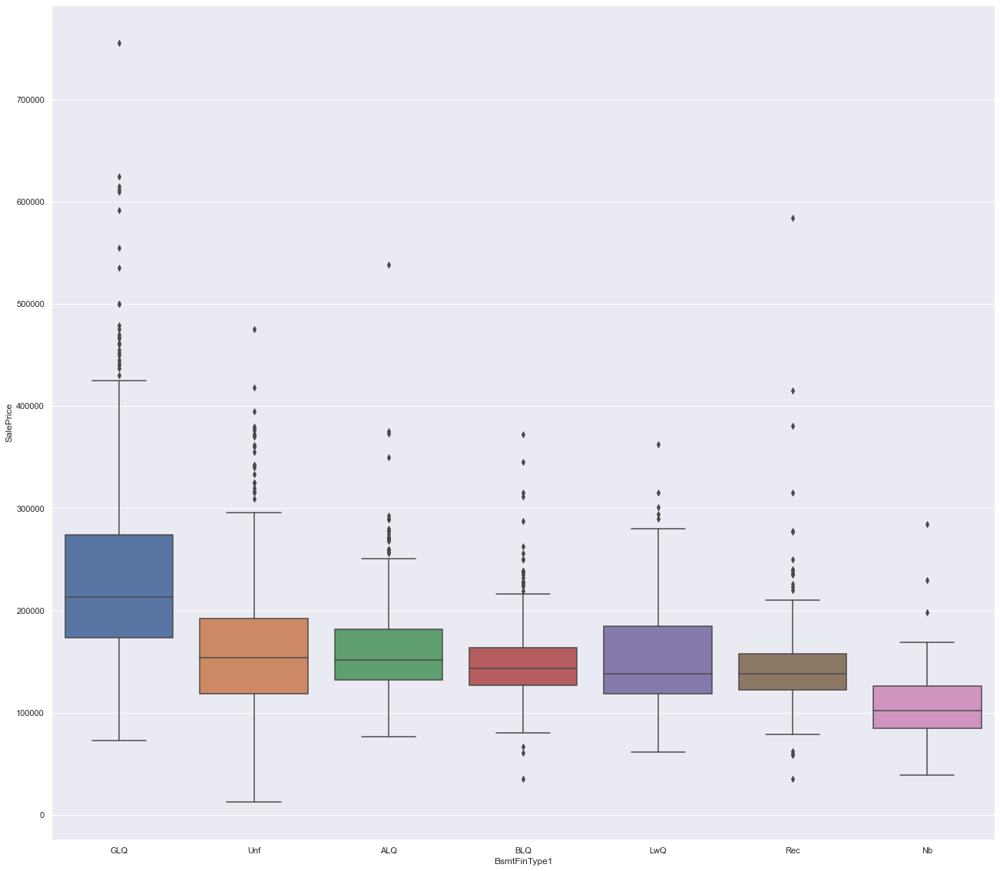

In [432]:
ordered=housing_fill_drop.groupby(by=["BsmtFinType1"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='BsmtFinType1', y='SalePrice', data= housing_fill_drop, order=ordered) 

In [434]:
housing_fill_drop['BsmtFinType1'].value_counts()

GLQ    753
Unf    706
ALQ    397
Rec    265
BLQ    251
LwQ    139
Nb      69
Name: BsmtFinType1, dtype: int64

<AxesSubplot:xlabel='BsmtFinType2', ylabel='SalePrice'>

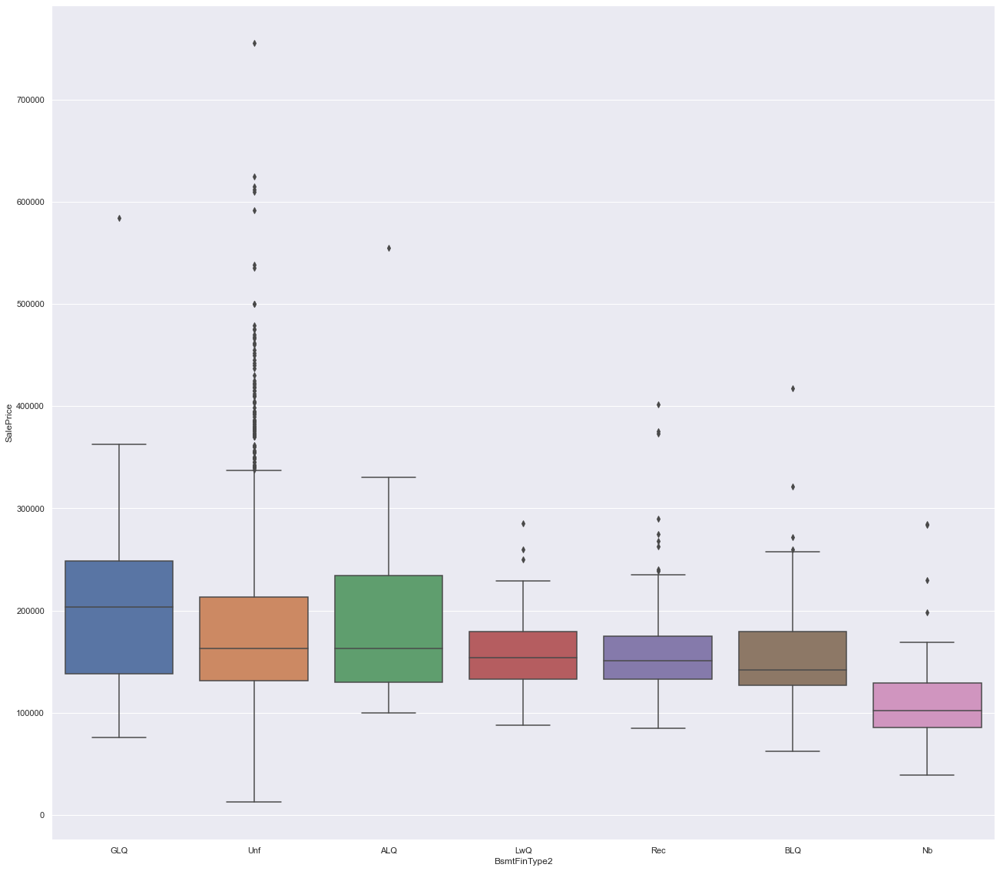

In [435]:
ordered=housing_fill_drop.groupby(by=["BsmtFinType2"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='BsmtFinType2', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='BsmtQual', ylabel='SalePrice'>

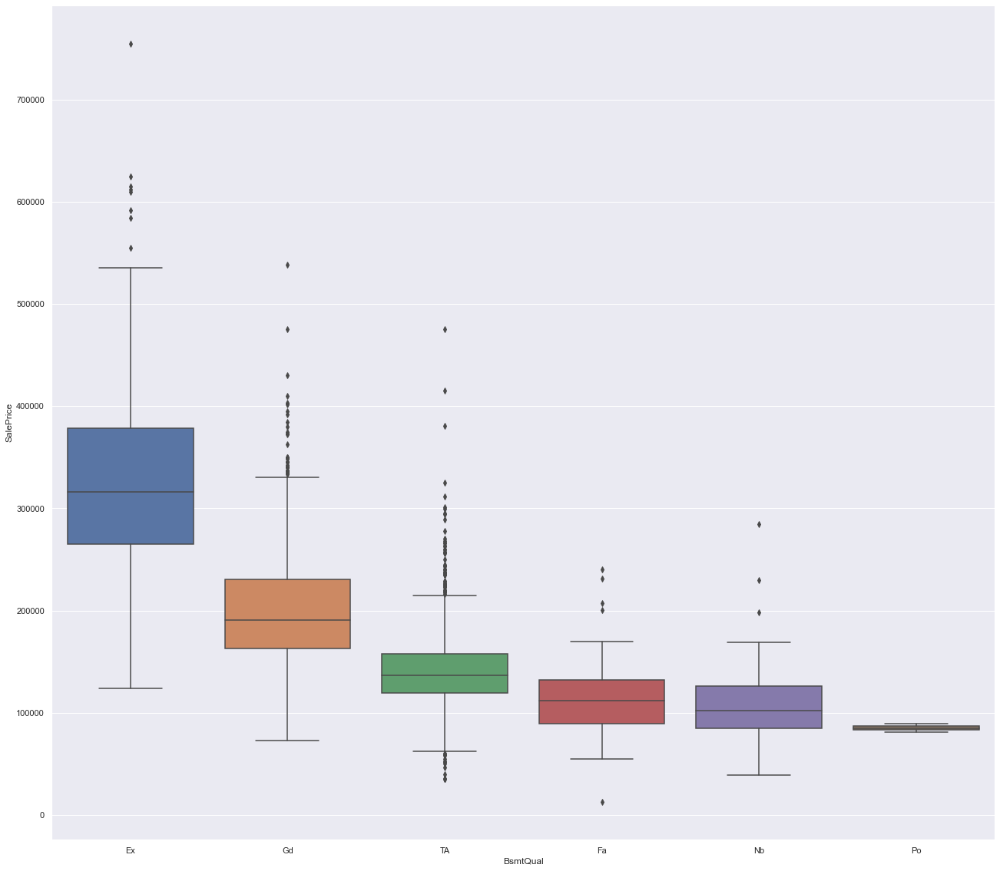

In [436]:
ordered=housing_fill_drop.groupby(by=["BsmtQual"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='BsmtQual', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='CentralAir', ylabel='SalePrice'>

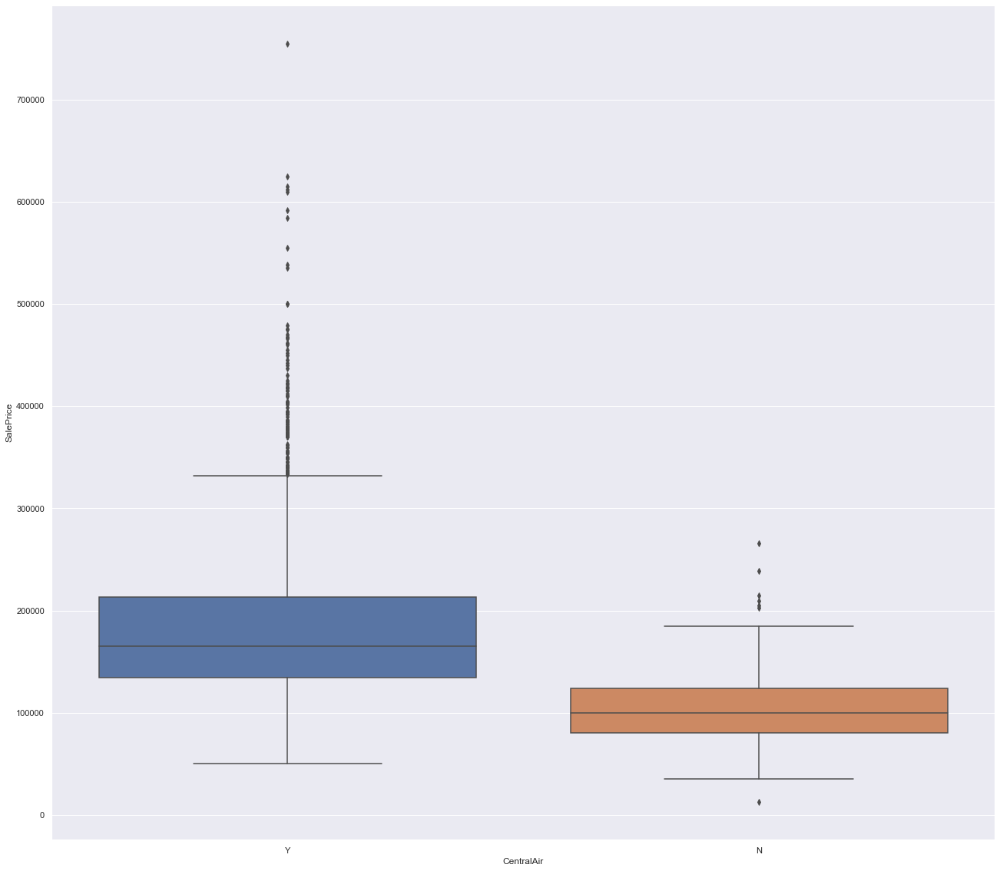

In [461]:
#CENTRAL AIR
ordered=housing_fill_drop.groupby(by=["CentralAir"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='CentralAir', y='SalePrice', data= housing_fill_drop, order=ordered) 

In [474]:
housing_fill_drop['CentralAir'].value_counts()

Y    2417
N     163
Name: CentralAir, dtype: int64

<AxesSubplot:xlabel='Condition1', ylabel='SalePrice'>

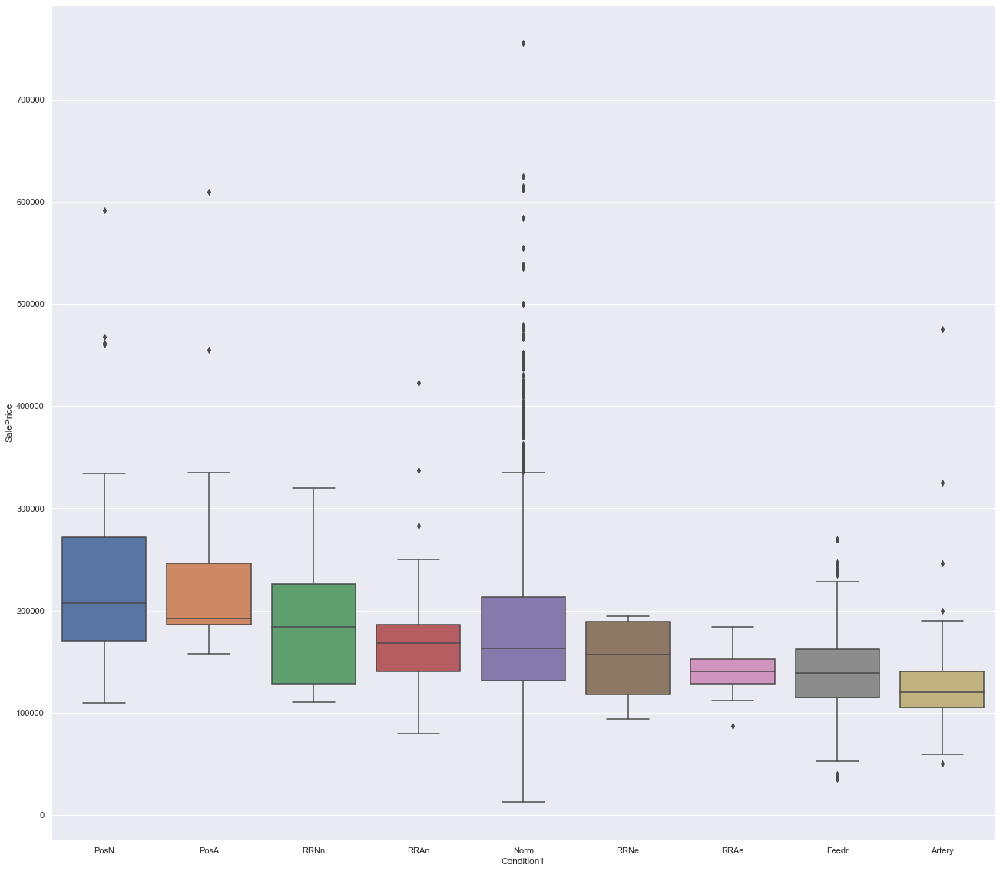

In [462]:
#Condition1
ordered=housing_fill_drop.groupby(by=["Condition1"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Condition1', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='Condition2', ylabel='SalePrice'>

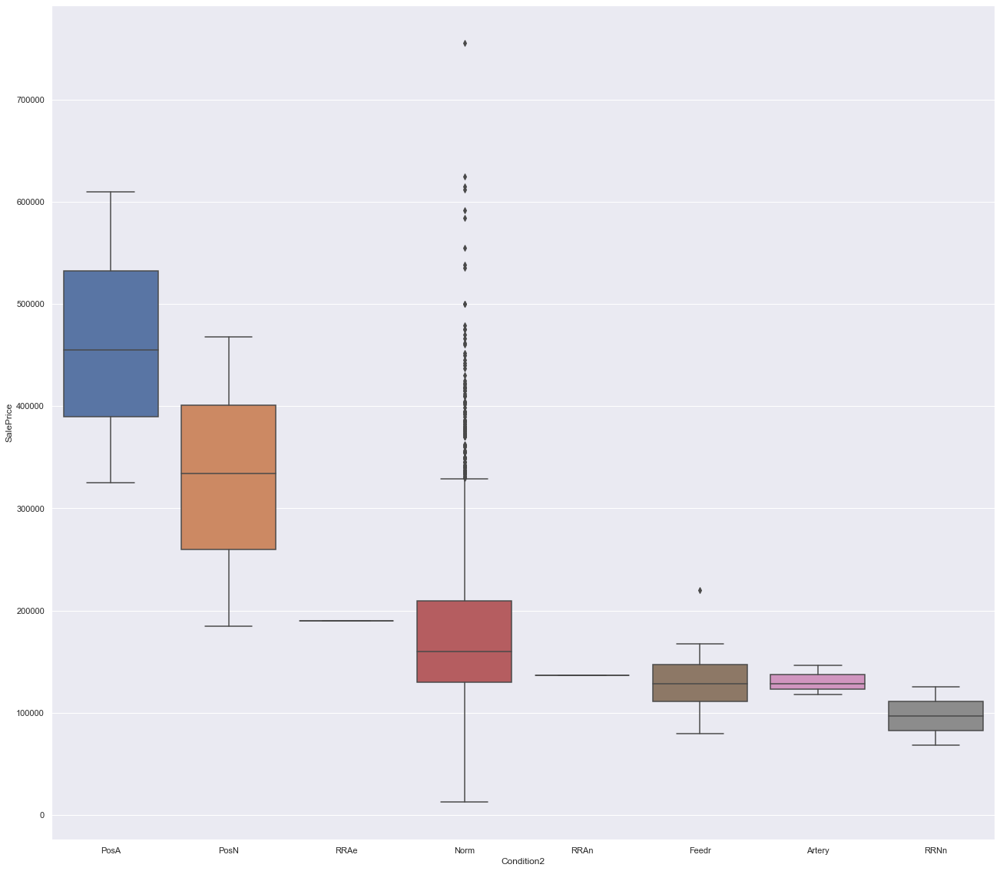

In [463]:
#Condition2
ordered=housing_fill_drop.groupby(by=["Condition2"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Condition2', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='Electrical', ylabel='SalePrice'>

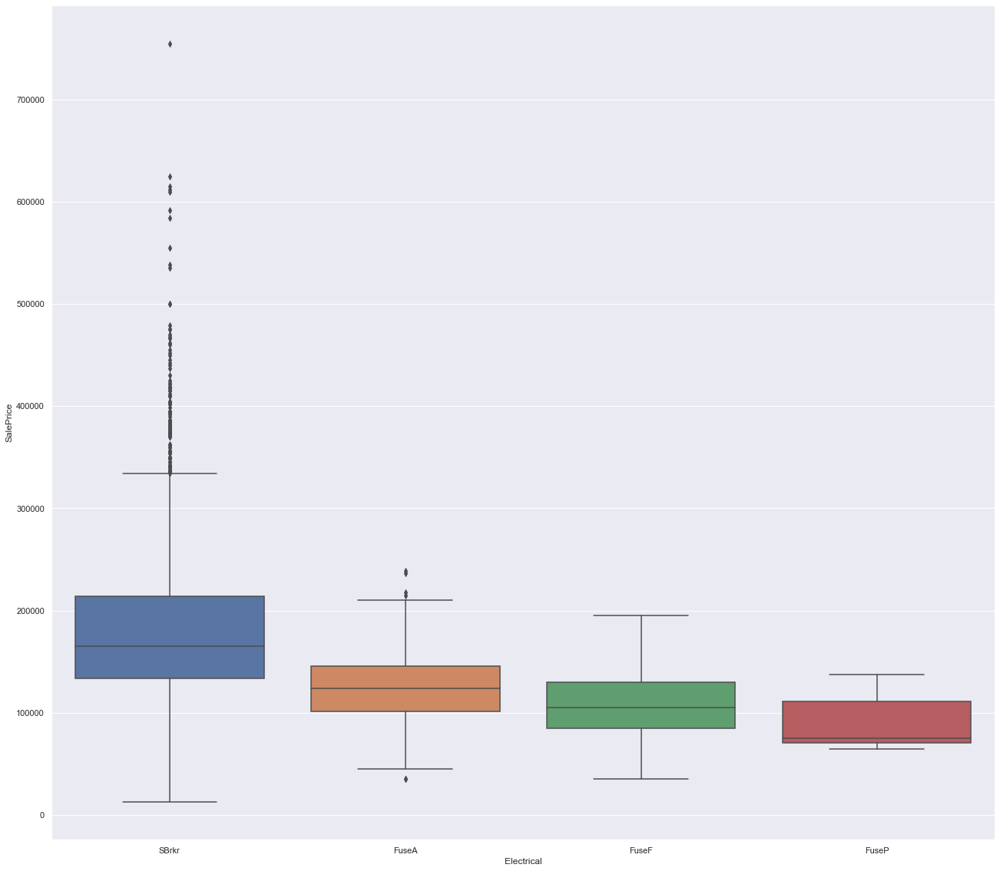

In [464]:
#Electrical
ordered=housing_fill_drop.groupby(by=["Electrical"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Electrical', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='ExterCond', ylabel='SalePrice'>

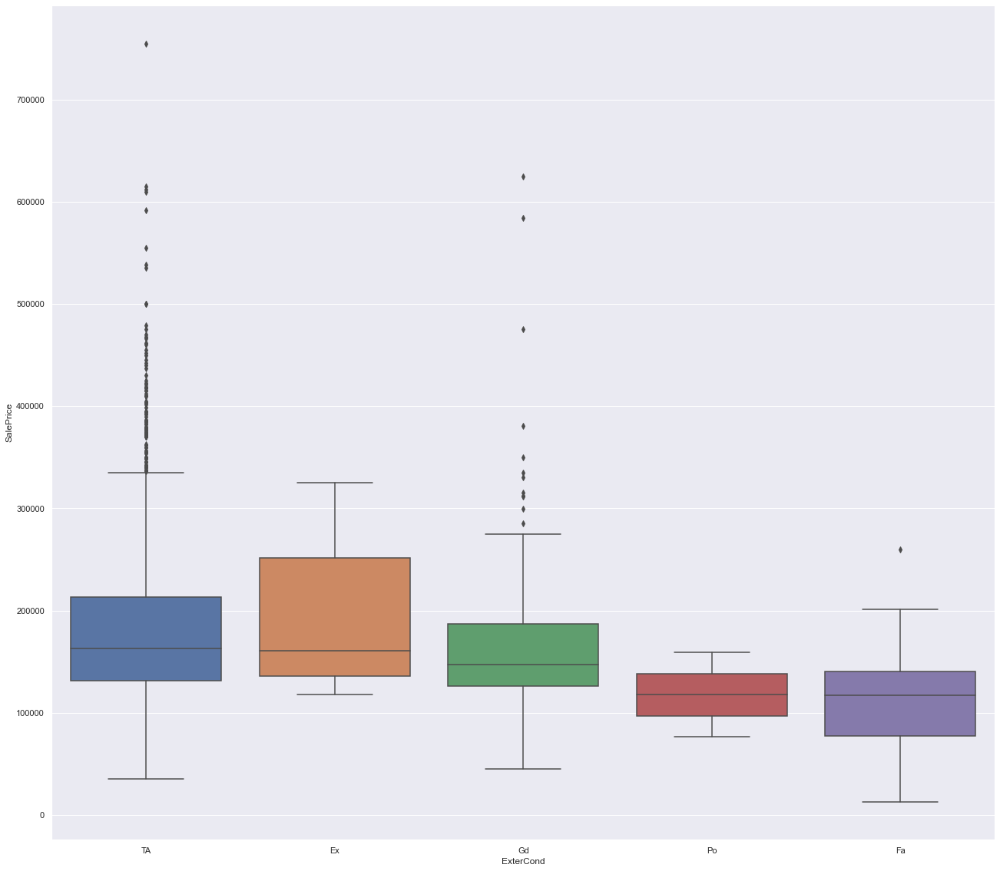

In [465]:
#External COnidtion
ordered=housing_fill_drop.groupby(by=["ExterCond"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='ExterCond', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='ExterQual', ylabel='SalePrice'>

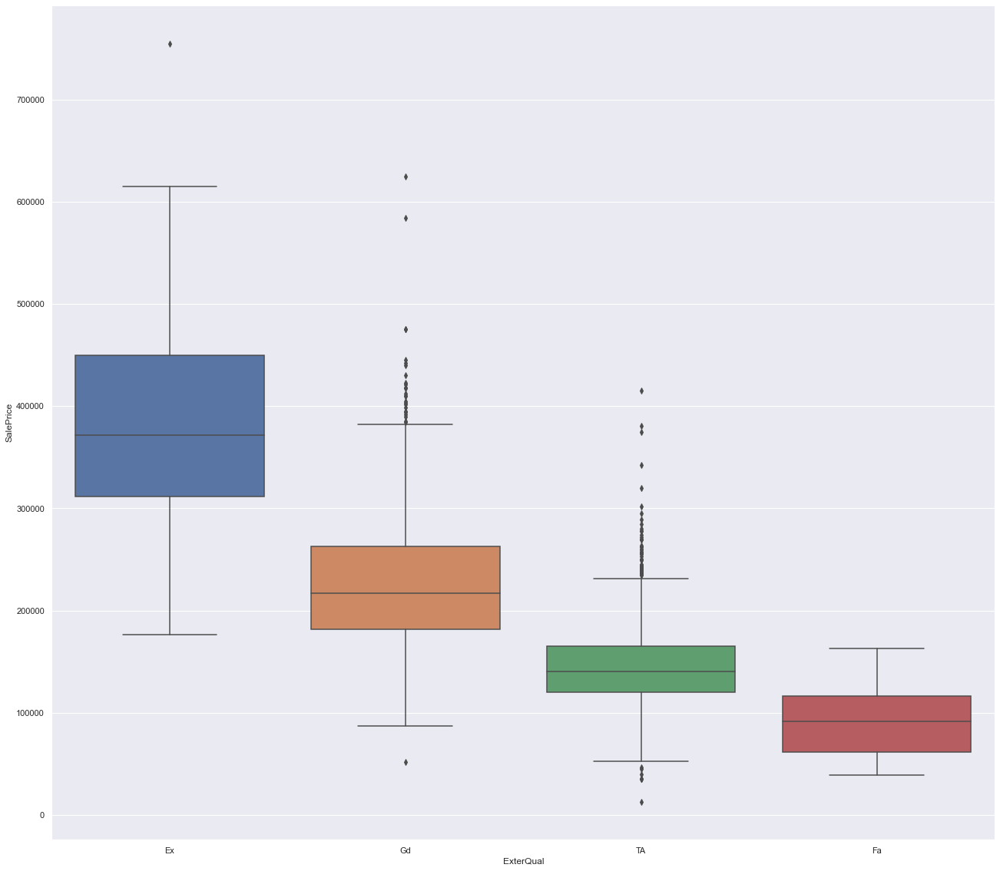

In [466]:
# ExterQual
ordered=housing_fill_drop.groupby(by=["ExterQual"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='ExterQual', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='Exterior1st', ylabel='SalePrice'>

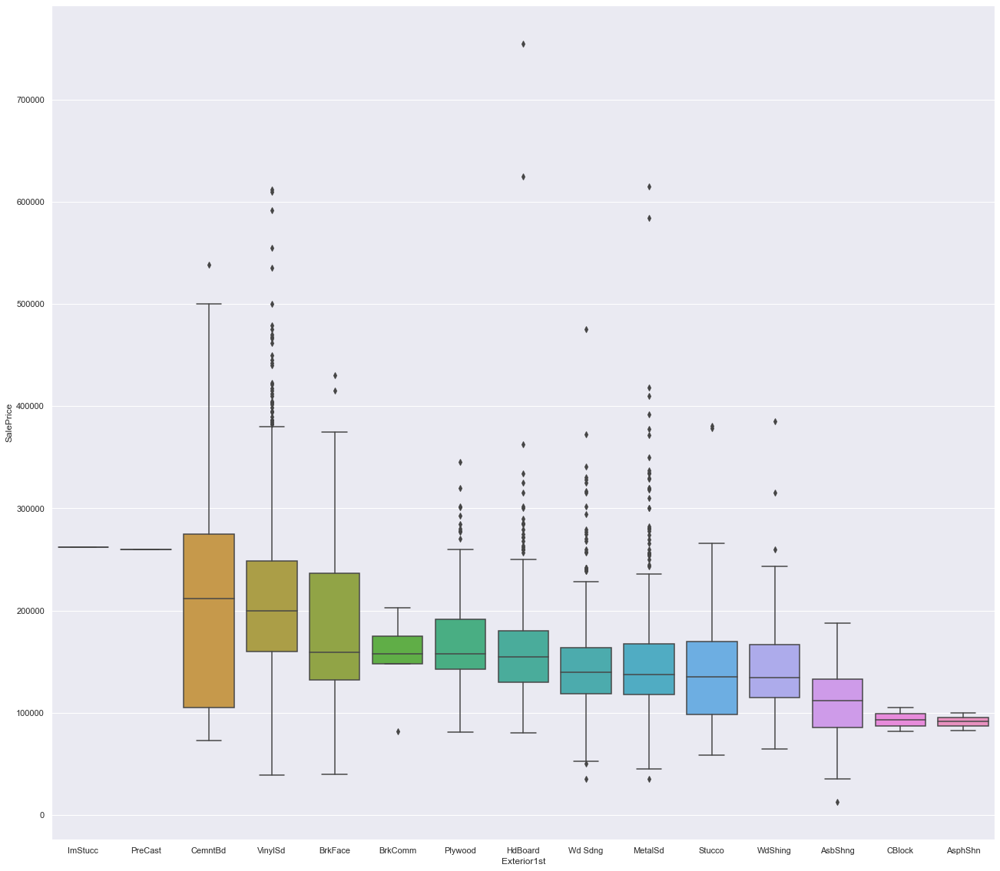

In [467]:
#Exterior1st
ordered=housing_fill_drop.groupby(by=["Exterior1st"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Exterior1st', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='Exterior2nd', ylabel='SalePrice'>

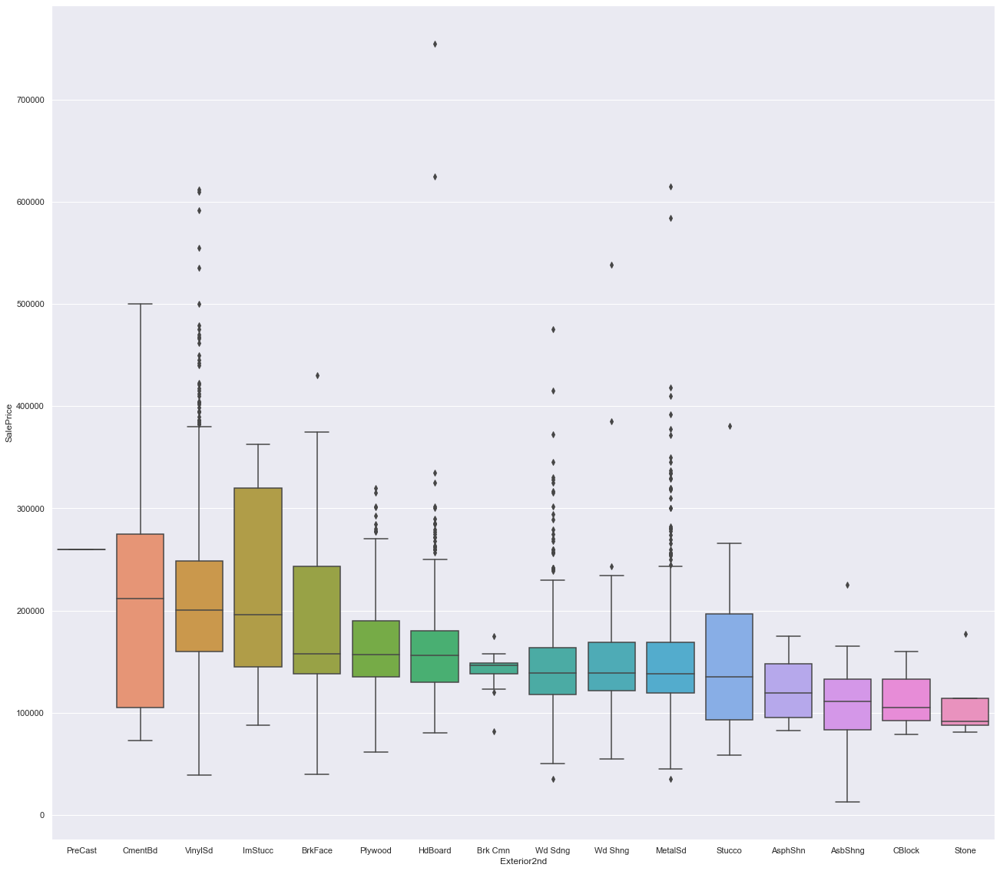

In [468]:
#Exterior2nd
ordered=housing_fill_drop.groupby(by=["Exterior2nd"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Exterior2nd', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='Fence', ylabel='SalePrice'>

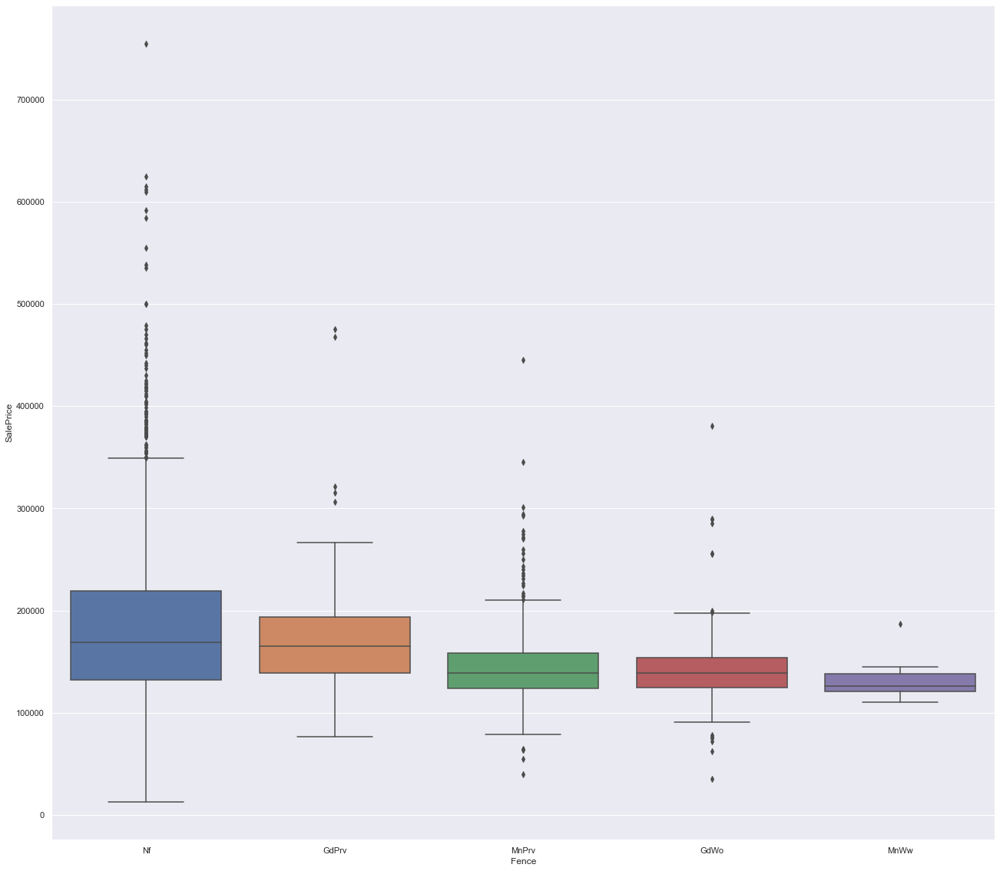

In [469]:
# Fence
ordered=housing_fill_drop.groupby(by=["Fence"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Fence', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='GarageCars', ylabel='SalePrice'>

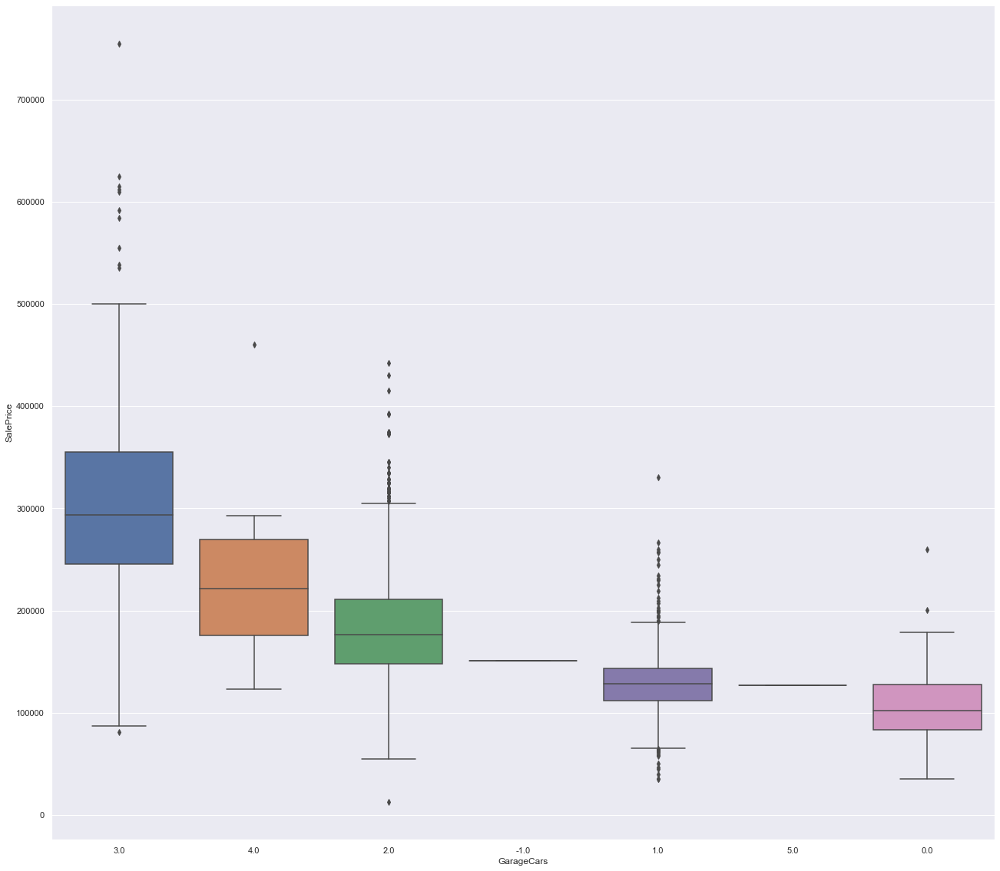

In [437]:
#GARAGE
ordered=housing_fill_drop.groupby(by=["GarageCars"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='GarageCars', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='GarageArea', ylabel='GarageCars'>

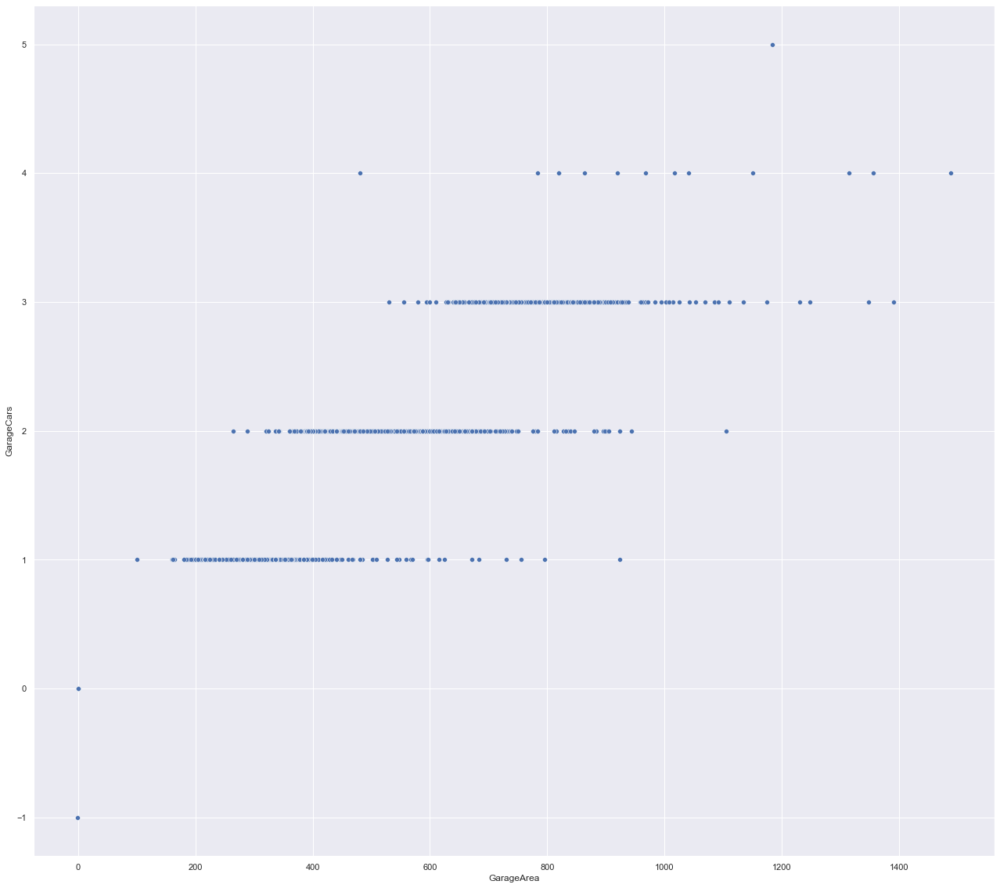

In [439]:
sns.scatterplot(x= 'GarageArea', y='GarageCars', data=housing_fill_drop)

<AxesSubplot:xlabel='GarageCond', ylabel='SalePrice'>

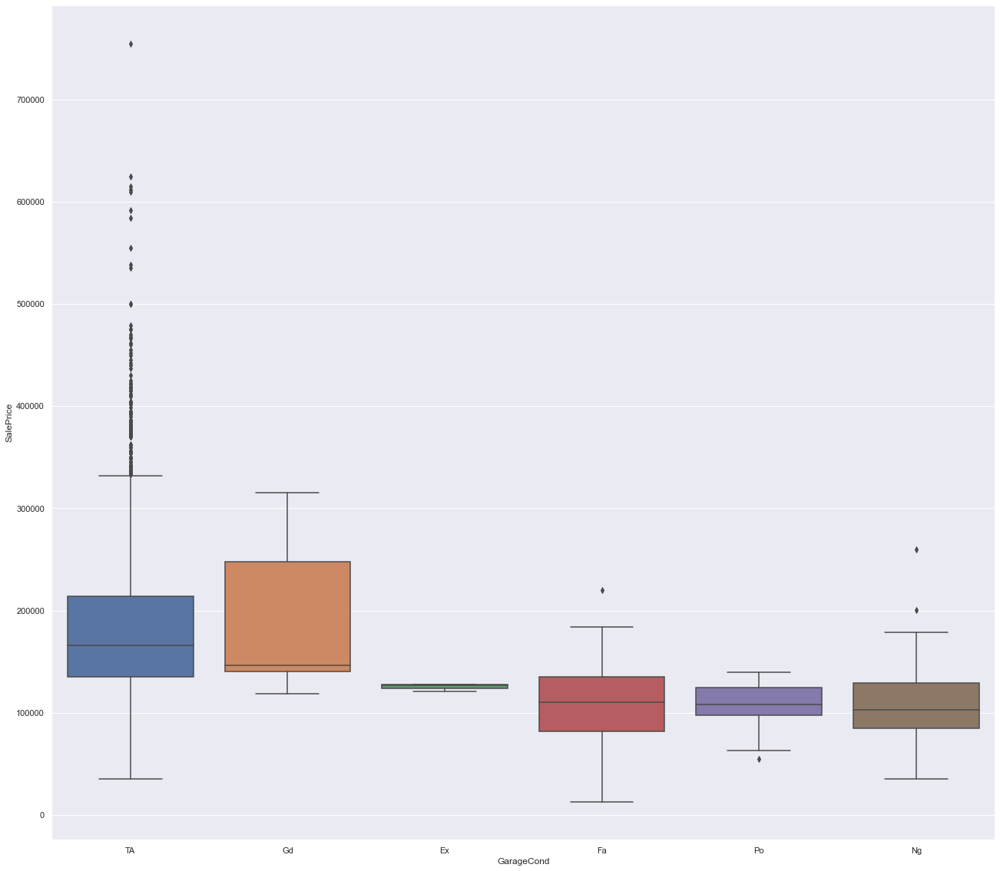

In [441]:
#Leaveout. Not making sense
ordered=housing_fill_drop.groupby(by=["GarageCond"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='GarageCond', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='GarageFinish', ylabel='SalePrice'>

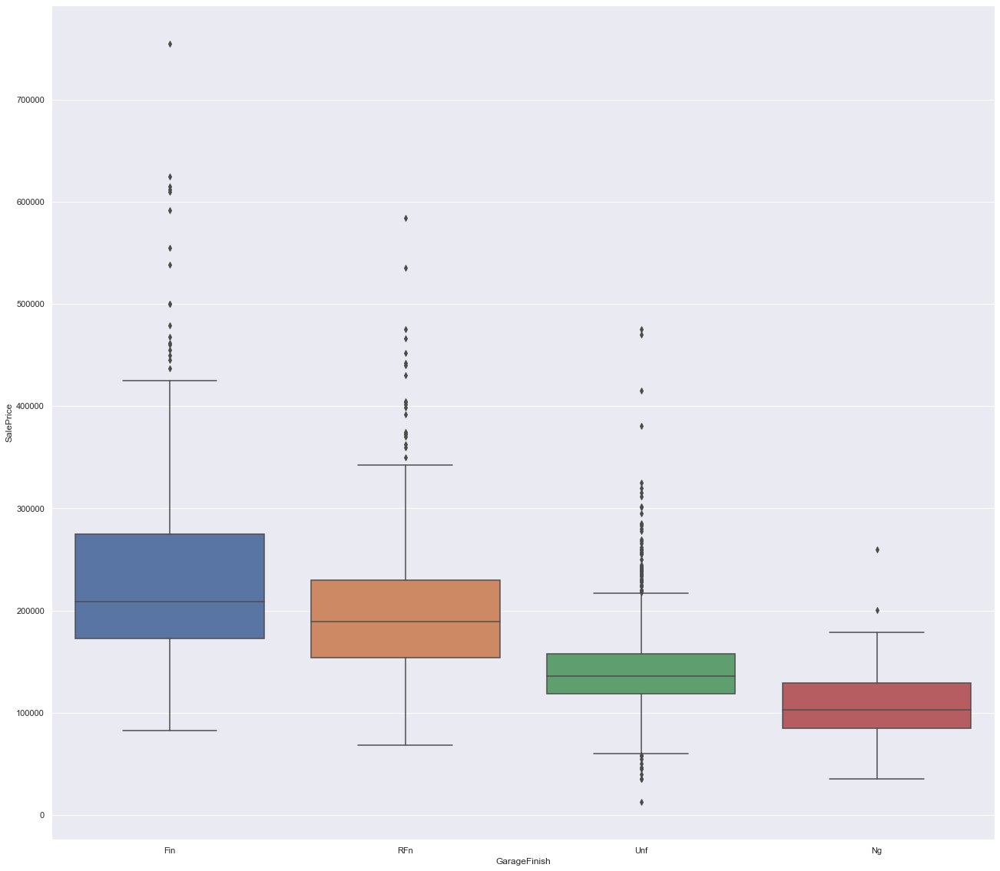

In [442]:
ordered=housing_fill_drop.groupby(by=["GarageFinish"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='GarageFinish', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='GarageQual', ylabel='SalePrice'>

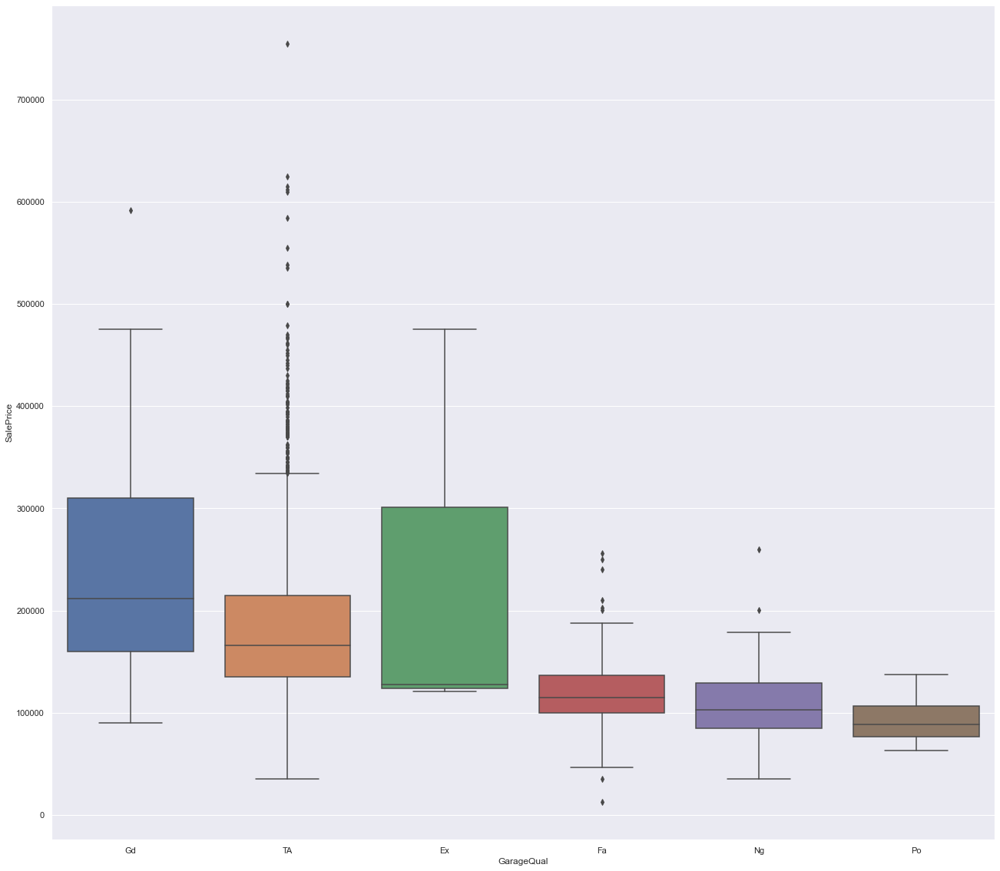

In [443]:
ordered=housing_fill_drop.groupby(by=["GarageQual"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='GarageQual', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='GarageType', ylabel='SalePrice'>

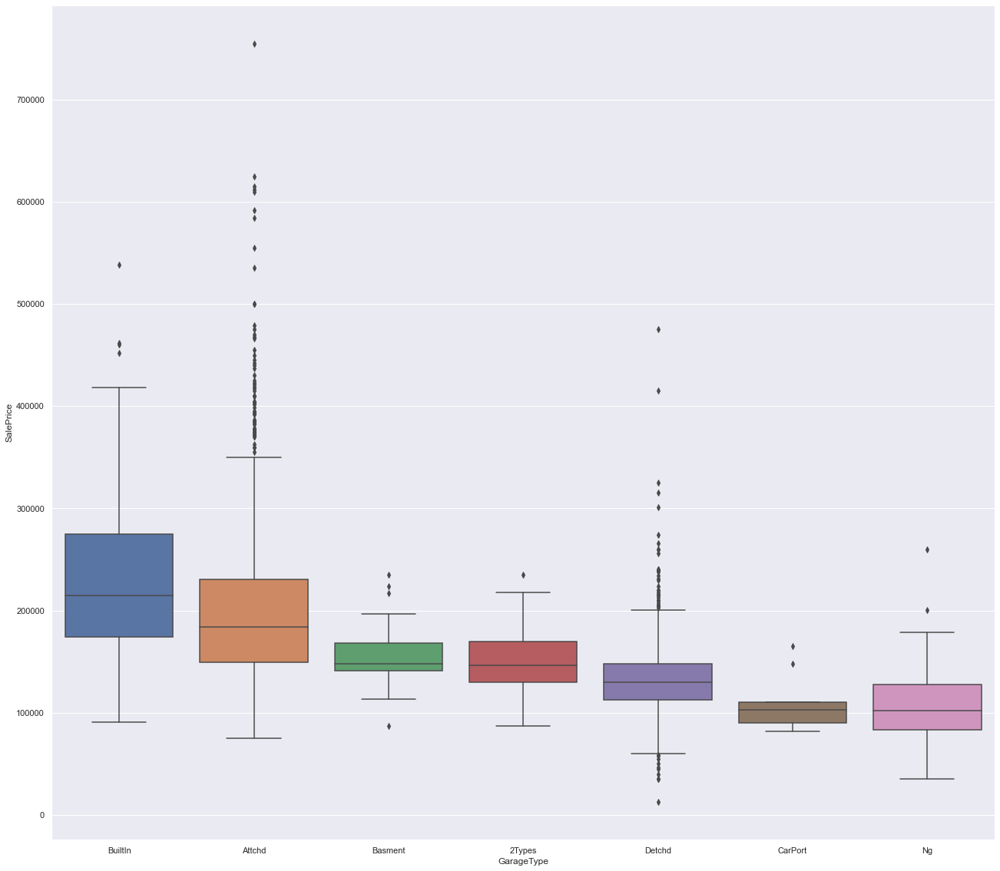

In [444]:
ordered=housing_fill_drop.groupby(by=["GarageType"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='GarageType', y='SalePrice', data= housing_fill_drop, order=ordered) 

In [475]:
housing_fill_drop['GarageType'].value_counts()

Attchd     1527
Detchd      716
BuiltIn     153
Ng          127
Basment      27
2Types       21
CarPort       9
Name: GarageType, dtype: int64

<AxesSubplot:xlabel='GarageYrBlt', ylabel='SalePrice'>

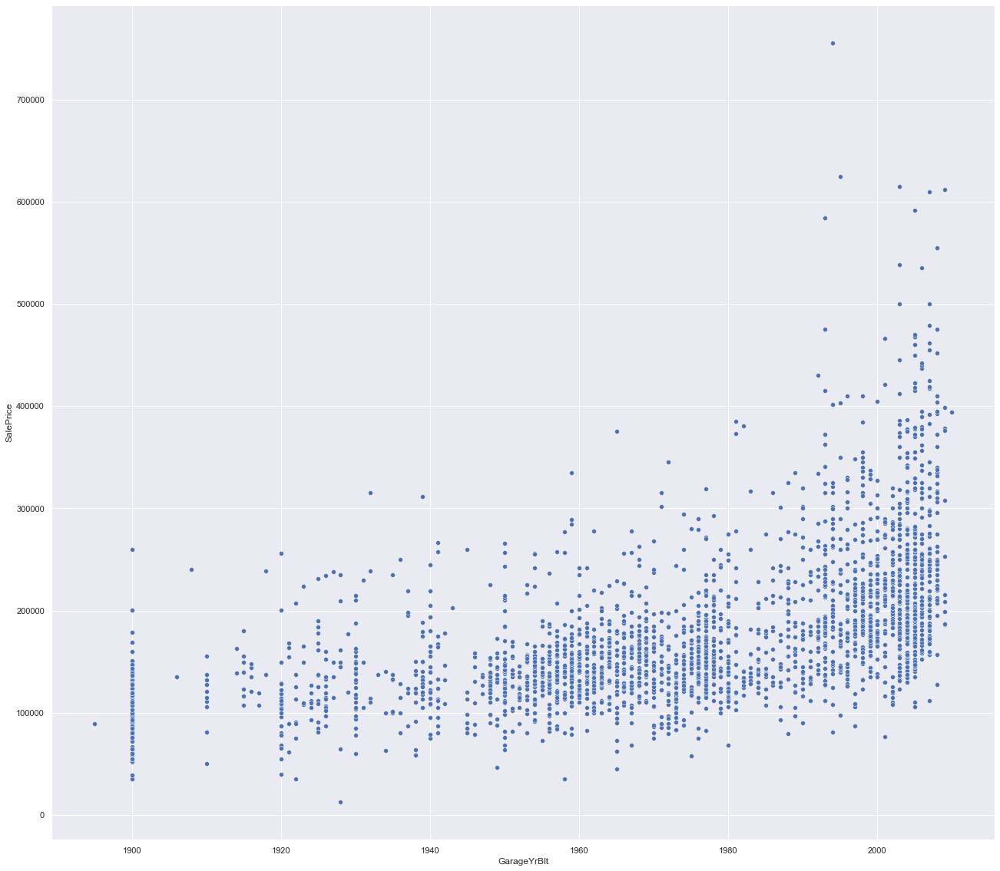

In [459]:
sns.scatterplot(x='GarageYrBlt', y='SalePrice', data= housing_fill_drop)